In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
pd.options.display.max_columns = None
import matplotlib.pyplot as plt
import pickle
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.rcParams['figure.figsize'] = [15,9.6]


In [2]:
e=1
nm=1000
r=nm/1000

In [3]:
#The def integrals takes the discrete energy depositions from specific proton energies and site sizes and calulated
#all the microdosimetric quantities for spectra and dose/frequency average values
#This includes:
#1: 

def integrals(e, nm, sim_d, frac):
    energy = pd.read_csv(f'energy/{sim_d}um/energy_{e}MeV_{nm}nm_k_frac{frac}_2025.csv', header=0) #
    energies = energy['0']
    entries=len(energies)
    print('no of events:', entries)
    
    
    r=nm/(2*1000);
    l = (4*r)/3
    y = energies/l
    
    maxy = max(y)*1.05
    print ('max y*1.05',max(y))

    #original bin size code
    binsize = round(3*np.std(y)*(len(y)**(-1/3)),2)
   
    Ebinsize = round(2*np.std(y)*(len(y)**(-1/3)),2)
    #temp test bin size
    #binsize = 0.1
    print('bin size is: ', binsize)
    print('ebinsize: ',Ebinsize)
    
    #change to fixed bin size for all energies/sites. The largest y-values are for low energy and small site. For 1 MeV
    #and 10 nm site we go up to X. espens maxy function goes to 105% of this
    


    # I N T E G R A L S & P L O T S
    ybins = np.arange(binsize/2,maxy,binsize).tolist()
    #plotting f(y) before normalization?
    plt.figure(0)
    plt.ylabel('f(y)??')
    plt.xlabel('[keV/µm]')
    h, bins1, patches = plt.hist(y,ybins, histtype = 'step')
    


    f_y = [x/(sum(h)*binsize) for x in h] #normalisering, integral av f_y = 1
    
 #   print('f_y:', f_y)

    #Kanskje er vi ferdige med "integrals her og kan skrive ut data??

    #f(y)*dy = integral(yf)
    integral_f_y = 0
    yf = 0

    for i in range(len(f_y)-1):
        fydy = f_y[i]*binsize
        integral_f_y += fydy #f(y)*dy sum, skal være 1

        y_i = ybins[i] #lineal energy for bin i

        yf += y_i*fydy      #integral (y*f(y)dy)

  #  print(integral_f_y)
    #print('yf is ', yf)
    

    # D O S E  P R O B A B I L I T Y  D E N S I T Y  F U N C T I O N
    dy = []
    yd = 0
    for i in range(len(f_y)):
        y_i = ybins[i]
        fydy = f_y[i]*binsize

        dy.append((y_i*f_y[i])/yf)
        yd += (y_i**2*fydy)/yf


  #  print('dy-spekteret som vi skal bruke', dy) #kanskje?
    print('sum av dy = ',sum(dy))
    #print('y_d = ', yd)
    print('len(ybins): ', len(ybins))

#Hedda vil interpolere f_y og så kan du regne ut alle dei andre. så vi vil printe lister av dy sammen med liste av bins
    # yd(y) 
    yd_y = []
    yd = 0
    for i in range(len(dy)):
        y_i = ybins[i]
        yd_y.append(dy[i]*y_i)
        yd += y_i*dy[i]*binsize  #integral y*d(y)*dy  
    
    plt.figure(3)
    plt.plot(ybins[:-1],yd_y)
    plt.xlabel(r'Lineal energy [keV/$\mu$m]')
    plt.ylabel('y*d(y)')
    plt.xscale('log')
    plt.grid(which='both', linewidth=0.8)
        
        
    print('y_d = ', yd, 'for ', nm, 'nm')
    
    
    return('ybins, yd_y,entries,yd,yf: ')#, ybins, yd_y, entries, yd, yf)





no of events: 209180
max y*1.05 14.664831000000001
bin size is:  0.05
ebinsize:  0.03
sum av dy =  20.000000000000043
len(ybins):  308
y_d =  1.946719369235485 for  1000 nm


'ybins, yd_y,entries,yd,yf: '

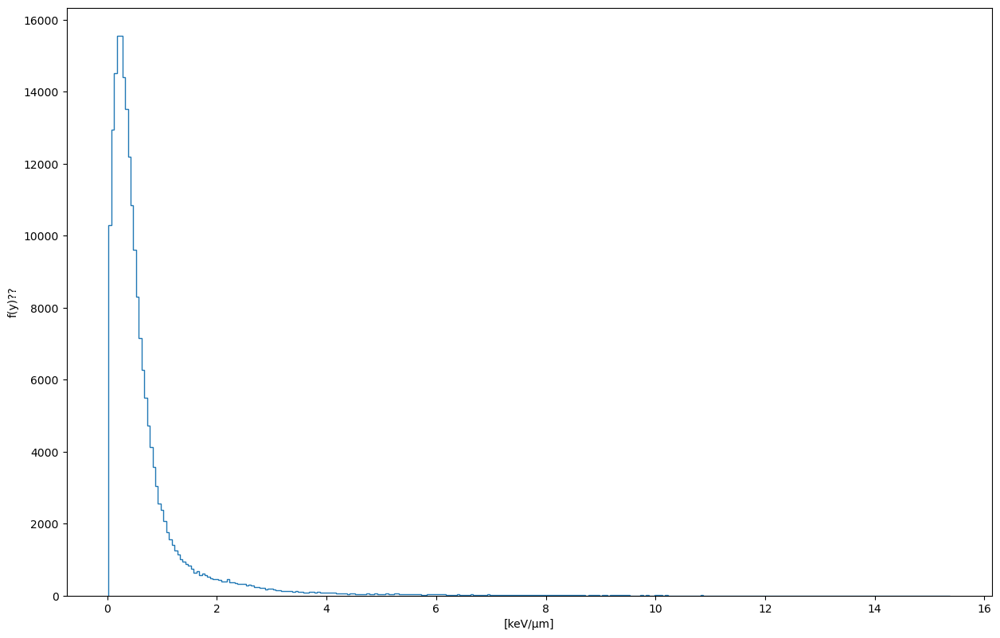

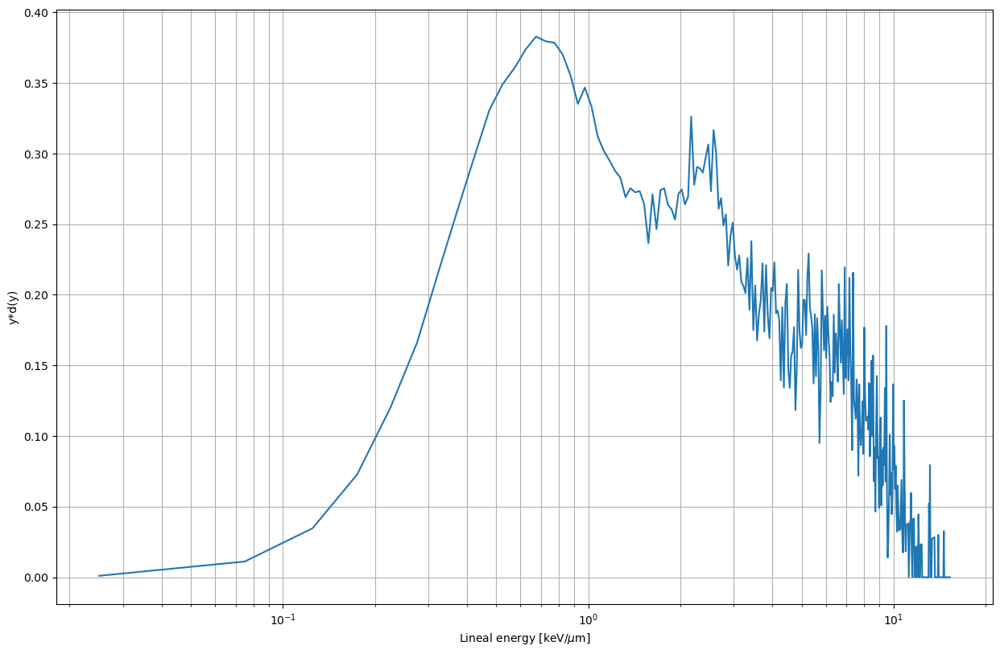

In [5]:
# Here we run the integrals Def with a single set of parameters. the def returns (ybins, yd_y, entries, yd,yf). in addition to generating plots (See code in [7]?)
integrals(e=100, nm=1000, sim_d=2, frac=129) #testing files from 2µm kristian 1µm og 2 µm sites


In [9]:
def ydyplots500nm(e, lst):
    plt.figure(1)
    plt.xlabel(r'Lineal energy [keV/$\mu$m]', fontsize=14)
    plt.ylabel('y*d(y)', fontsize=14)
    plt.xscale('log')
    sim_d=0.5
    
    yd_list = []
    yf_list = []
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6']
    col=0
    plt.figure(1, figsize=(20,10), dpi=500)

    for nm in lst:
        
        ybins, yd_y, entries, yd, yf = integrals(e,nm,sim_d);
        scientific_entries = "{:.1e}".format(entries)
        plt.figure(1)
        plt.plot(ybins[:-1],yd_y, linewidth=1.5, label = f'{nm} ,{yd.round(2)} ,#{scientific_entries}', color=colors[col] )
        plt.axvline(x=yd,color=colors[col], linestyle='--', lw=1.2 )
        yd_list.append(yd)
        yf_list.append(yf)
        col+=1
        
        
    plt.figure(1, figsize=(30,20), dpi=200)
    plt.legend(loc="upper left", fontsize=14, title = r'Diameter [nm]  , $\bar{y}_D$ , entries', title_fontsize=16)
    plt.title(f'Dose distributions for {e}MeV Protons')
    plt.grid(which='both', linewidth=0.8)
    
    plt.show()
    
    return yd_list, yf_list

        

y_d =  2.523597129221115 for  500 nm
y_d =  4.213365616971974 for  200 nm
y_d =  5.6952731643978876 for  100 nm
y_d =  7.954299930733786 for  50 nm
y_d =  12.331894940344032 for  20 nm
y_d =  17.72540868137787 for  10 nm


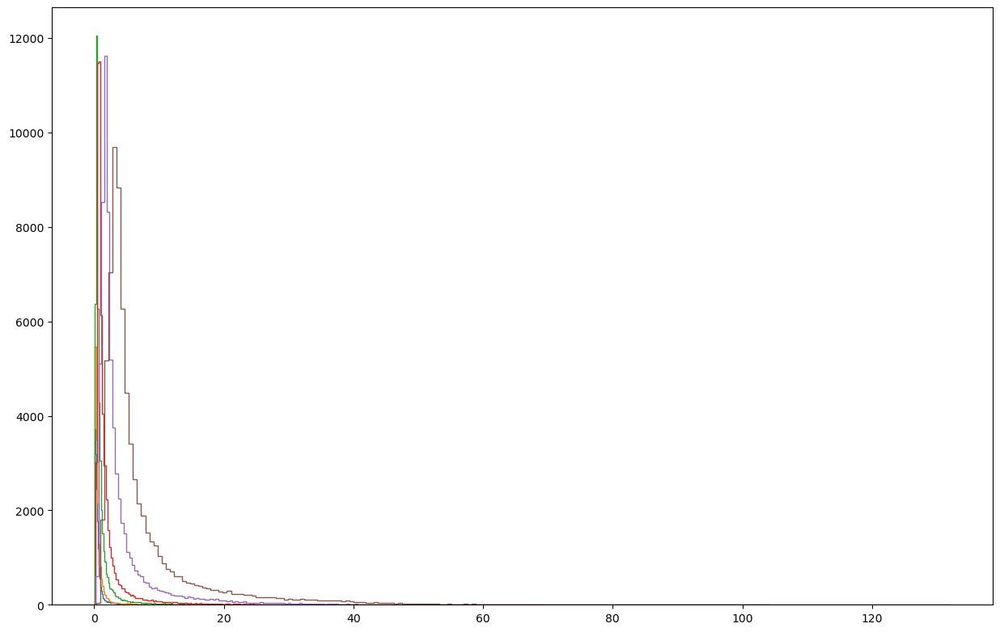

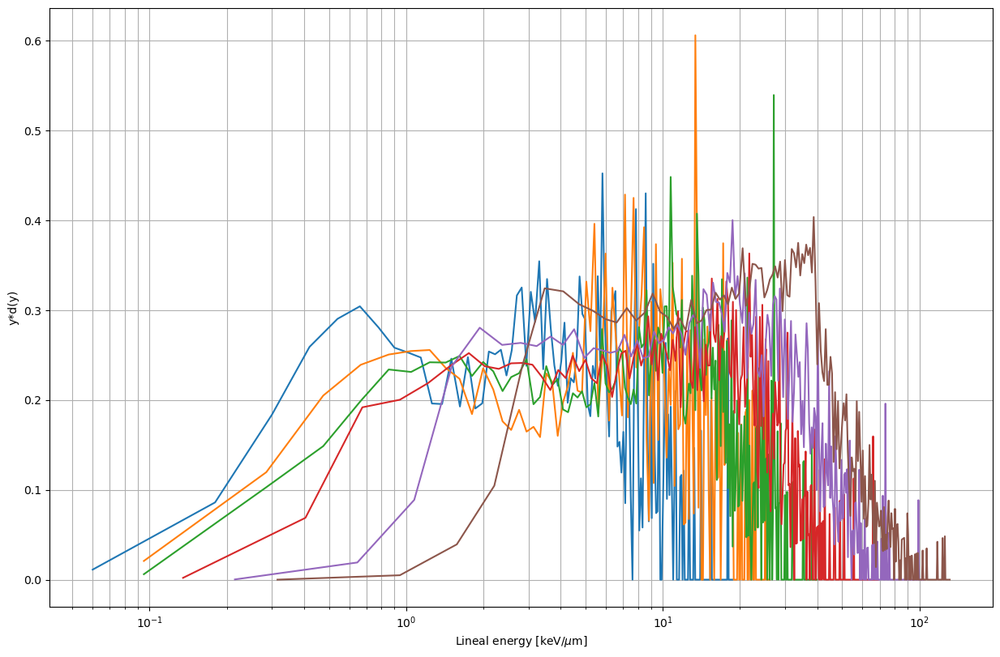

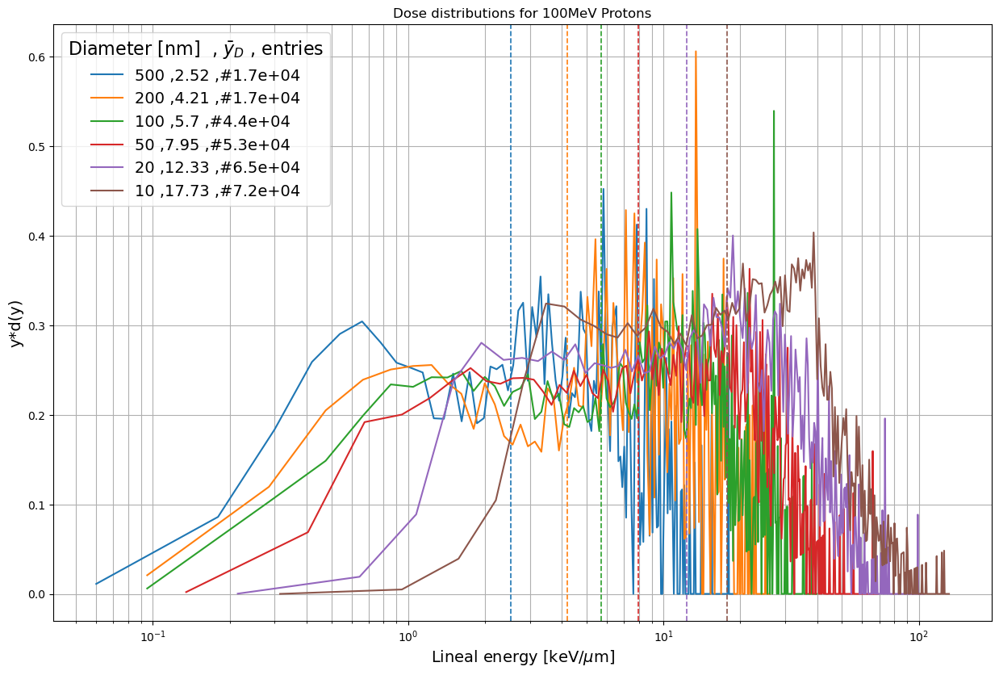

In [10]:
ydlist_500, yflist_500 = ydyplots500nm(100, [500, 200, 100, 50, 20, 10])

In [11]:
print(yflist_500)

[0.611864656123575, 0.7778662380625427, 1.145062464248942, 1.8980580001125833, 4.008516519361902, 7.251642599782146]


y_d =  29.982399531419222 for  500 nm
y_d =  30.40642534323731 for  200 nm
y_d =  30.543285751403523 for  100 nm
y_d =  30.146708368791202 for  50 nm
y_d =  30.669984415637842 for  20 nm
y_d =  34.10711870299759 for  10 nm


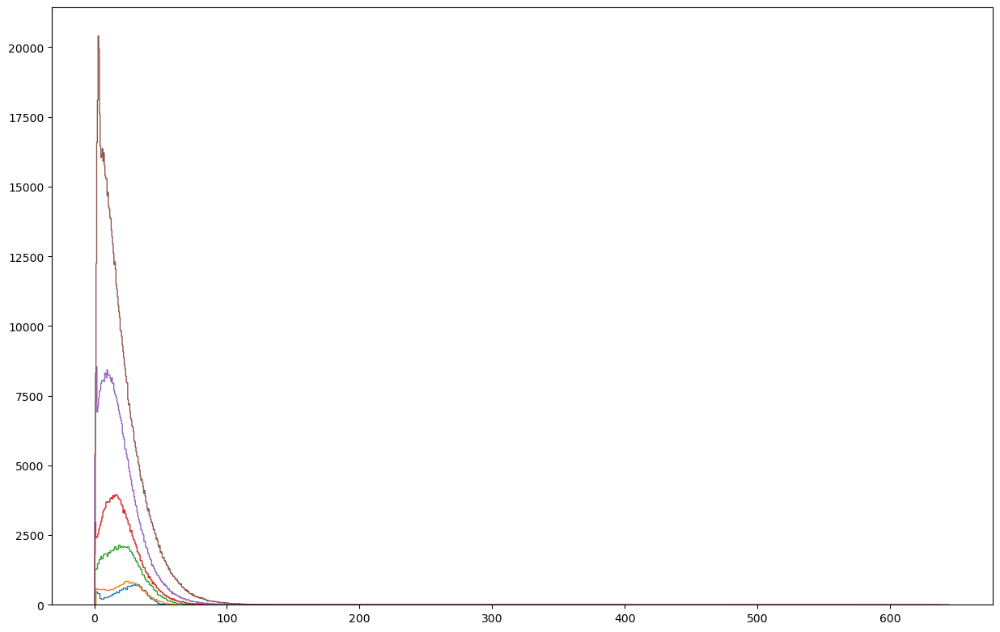

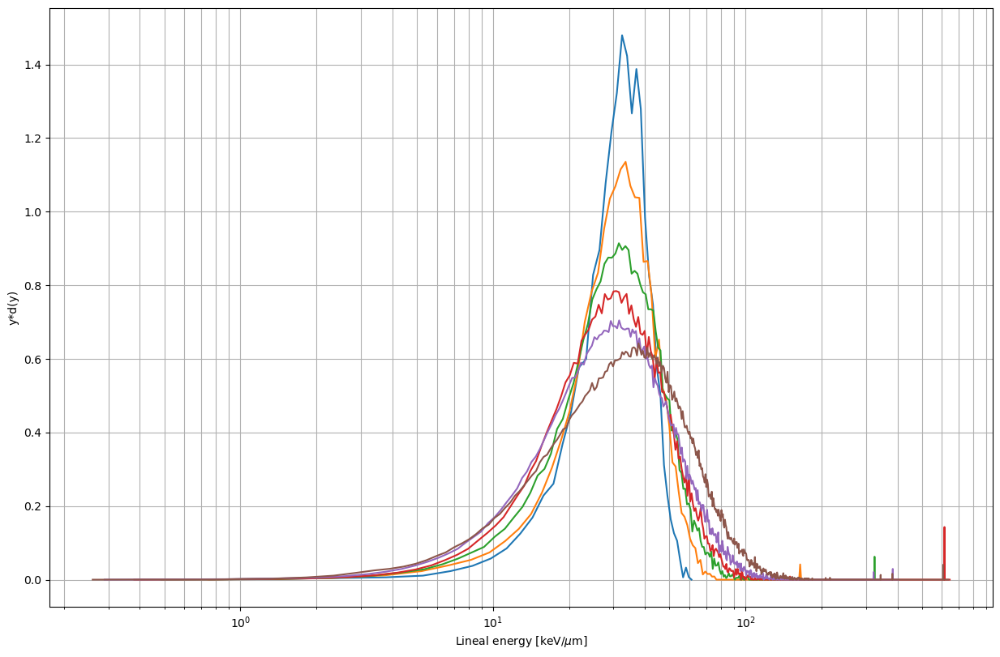

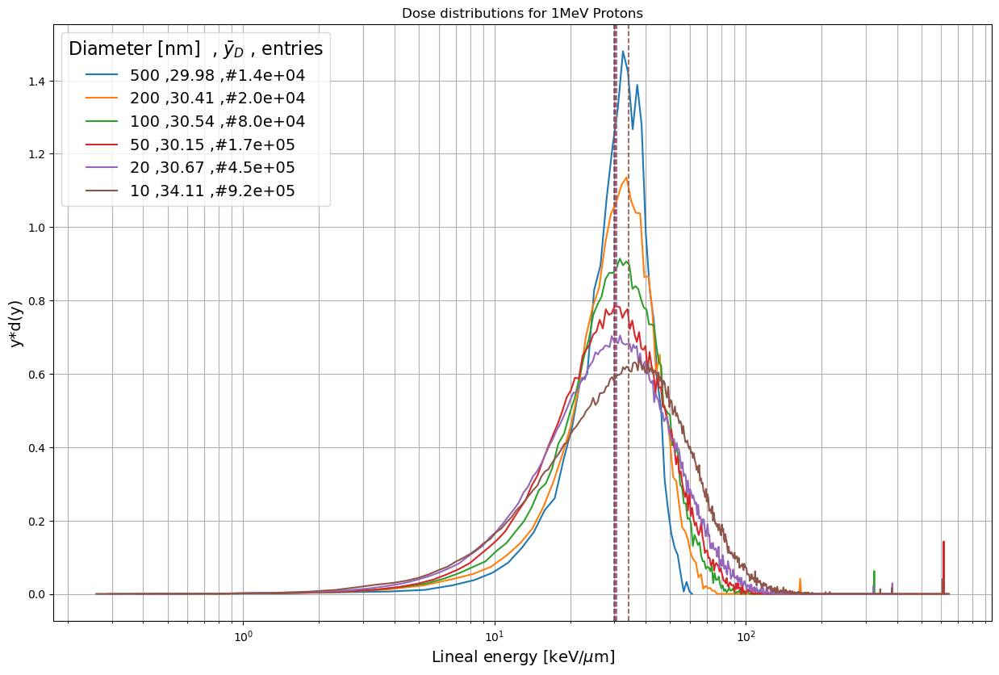

[29.982399531419222, 30.40642534323731, 30.543285751403523, 30.146708368791202, 30.669984415637842, 34.10711870299759]
y_d =  18.136232966652603 for  500 nm
y_d =  18.139525422218263 for  200 nm
y_d =  18.211418898342316 for  100 nm
y_d =  19.047197004434498 for  50 nm
y_d =  21.576193716094185 for  20 nm
y_d =  26.115911215469083 for  10 nm


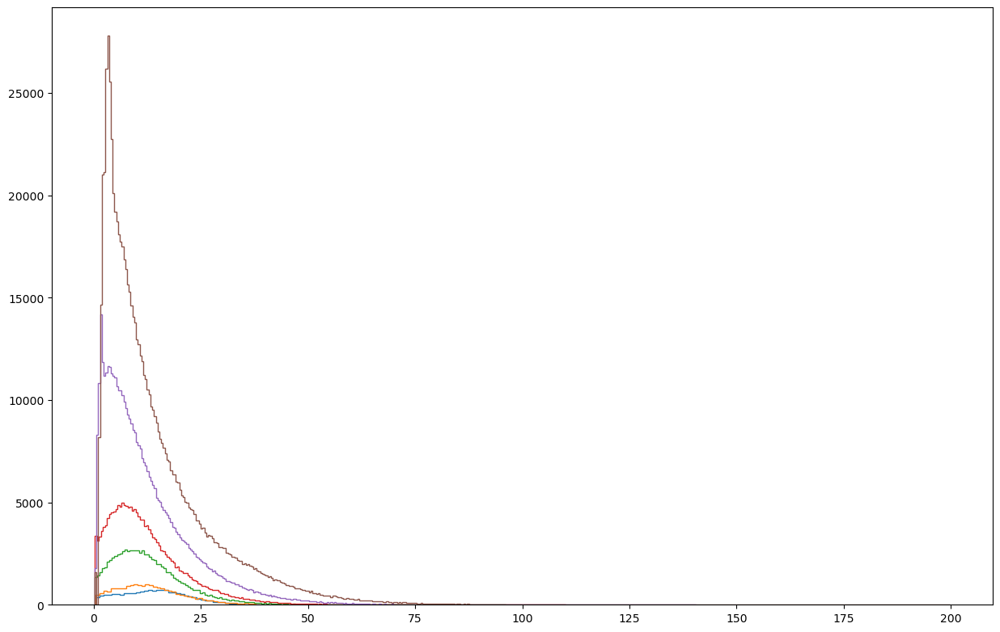

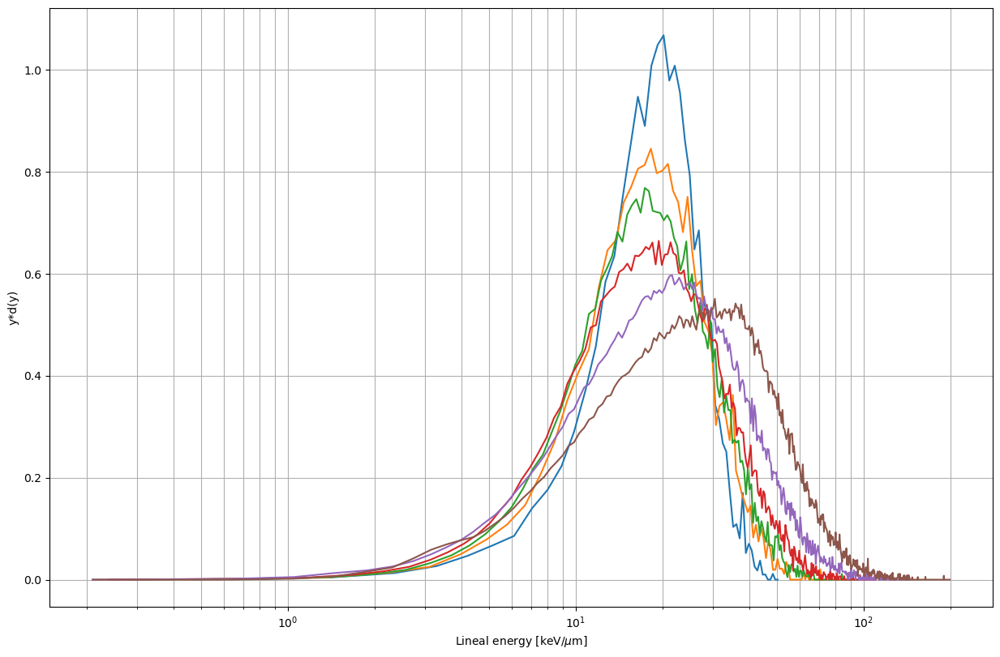

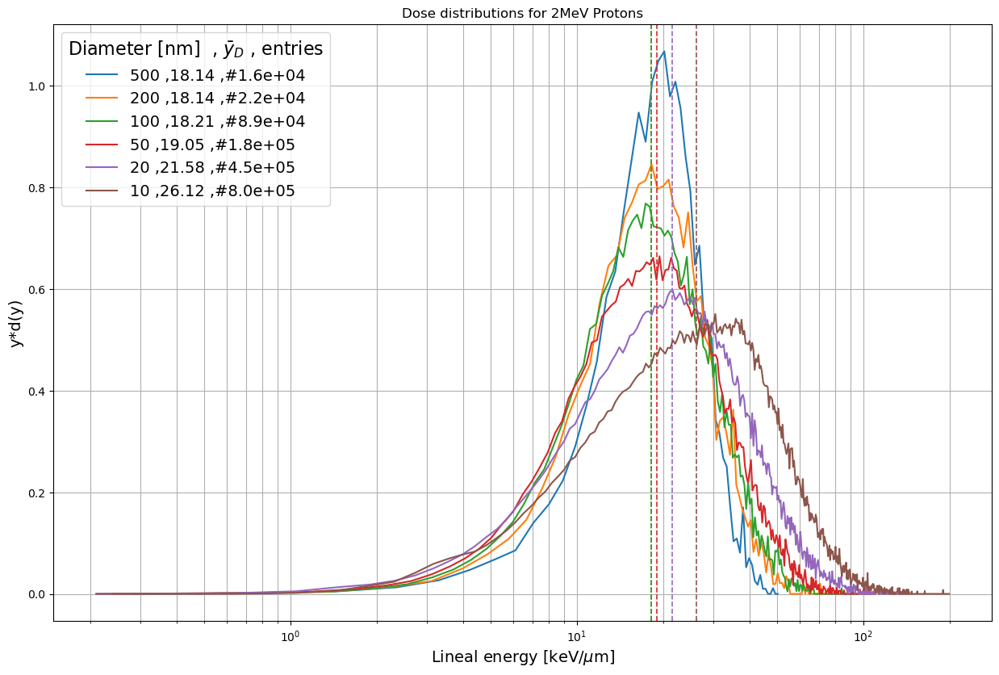

[18.136232966652603, 18.139525422218263, 18.211418898342316, 19.047197004434498, 21.576193716094185, 26.115911215469083]
y_d =  8.994051759144531 for  500 nm
y_d =  9.662353351476598 for  200 nm
y_d =  10.707344132169526 for  100 nm
y_d =  12.431820293379293 for  50 nm
y_d =  16.189438128573258 for  20 nm
y_d =  21.265567028508972 for  10 nm


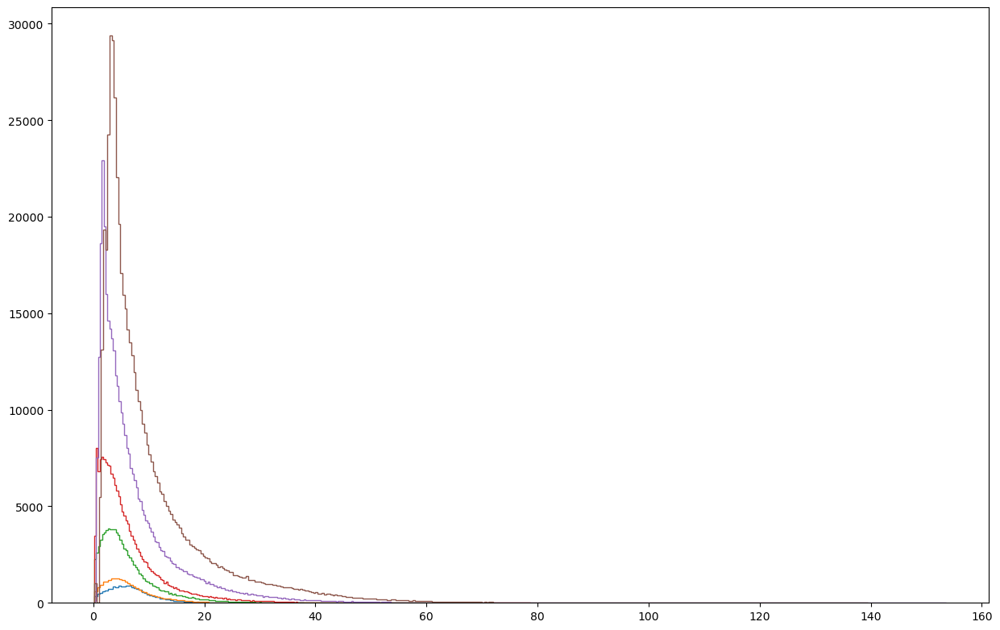

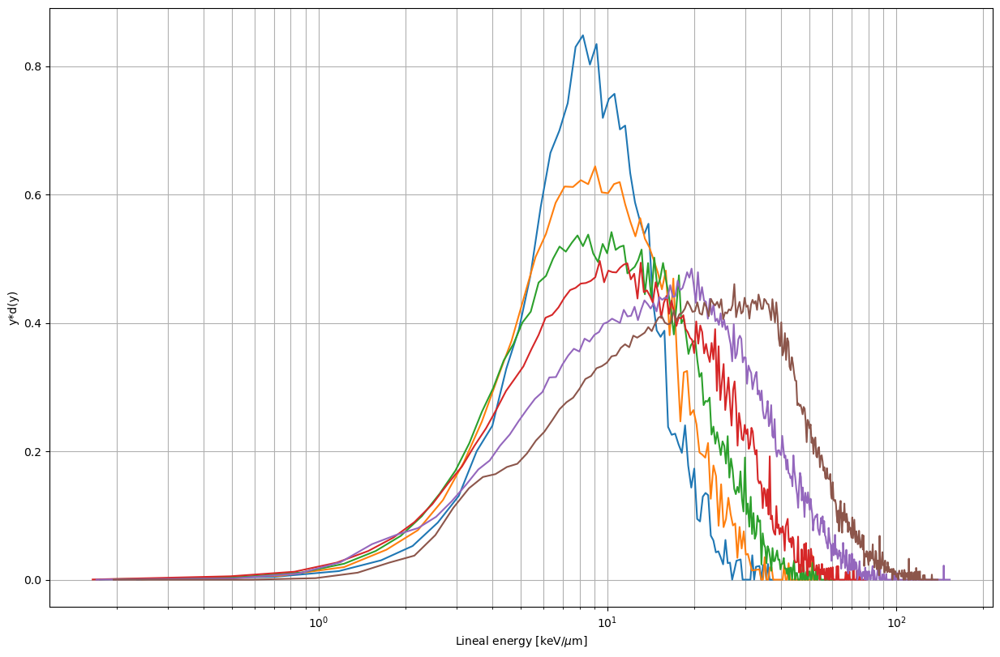

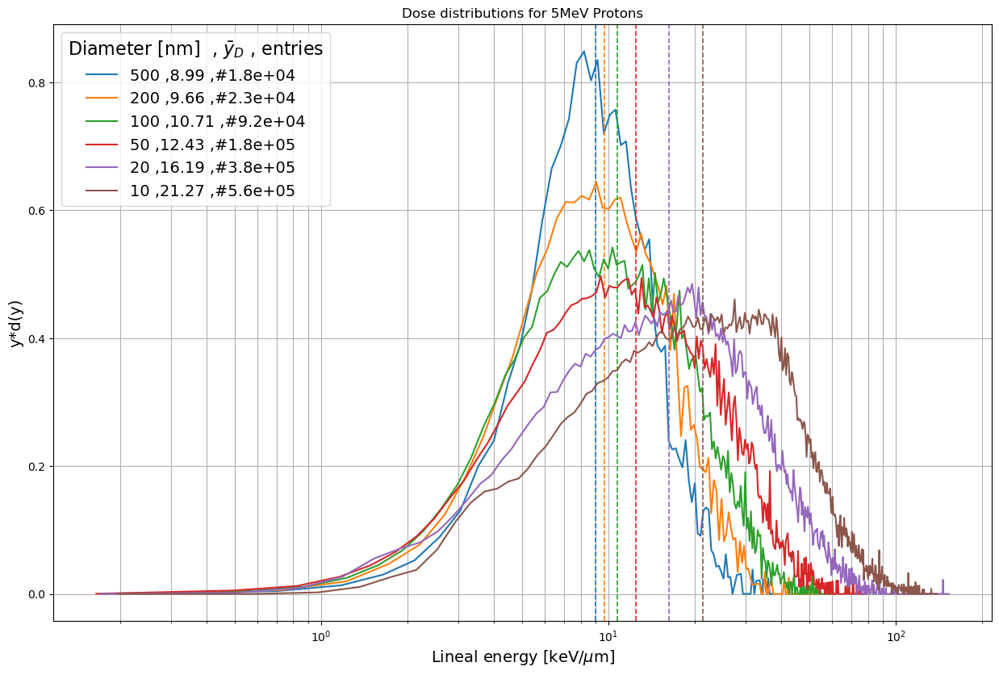

[8.994051759144531, 9.662353351476598, 10.707344132169526, 12.431820293379293, 16.189438128573258, 21.265567028508972]
y_d =  5.658273418813091 for  500 nm
y_d =  6.787071118724001 for  200 nm
y_d =  8.16245645173164 for  100 nm
y_d =  10.287969056135388 for  50 nm
y_d =  14.352821206543737 for  20 nm
y_d =  19.5327516164616 for  10 nm


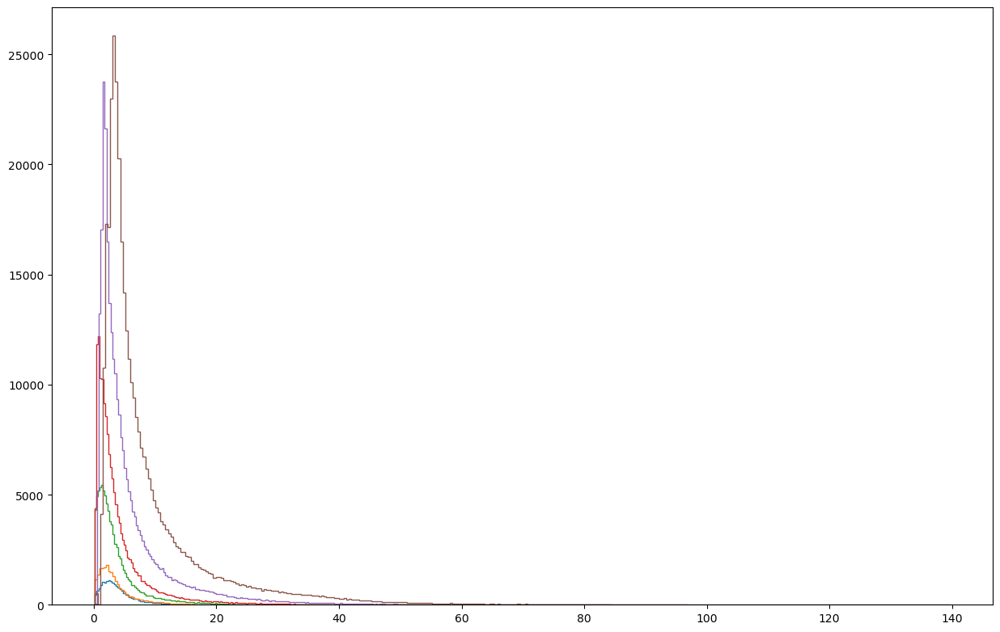

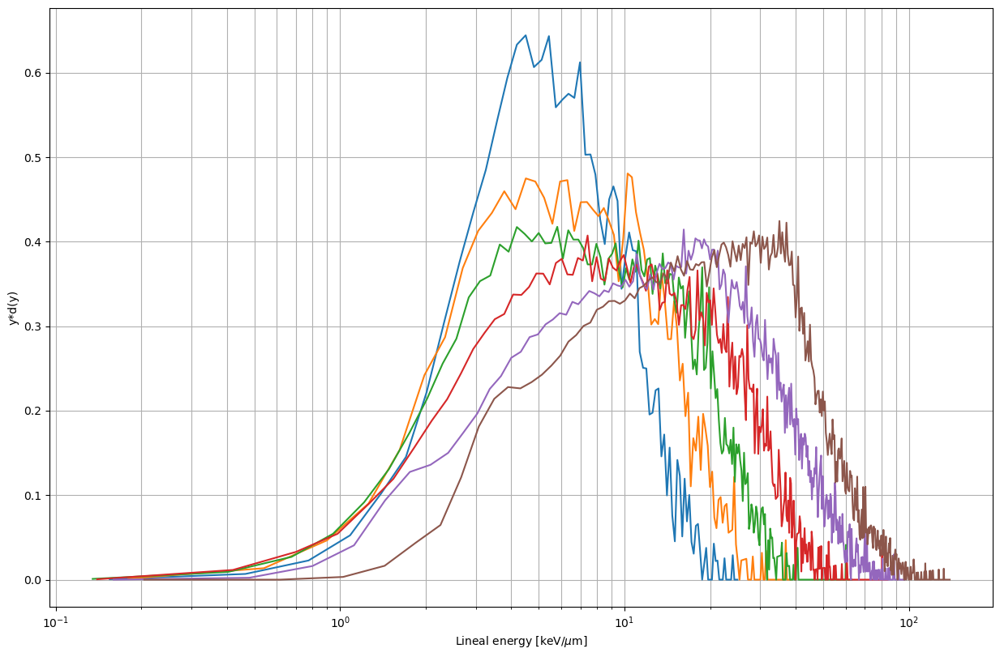

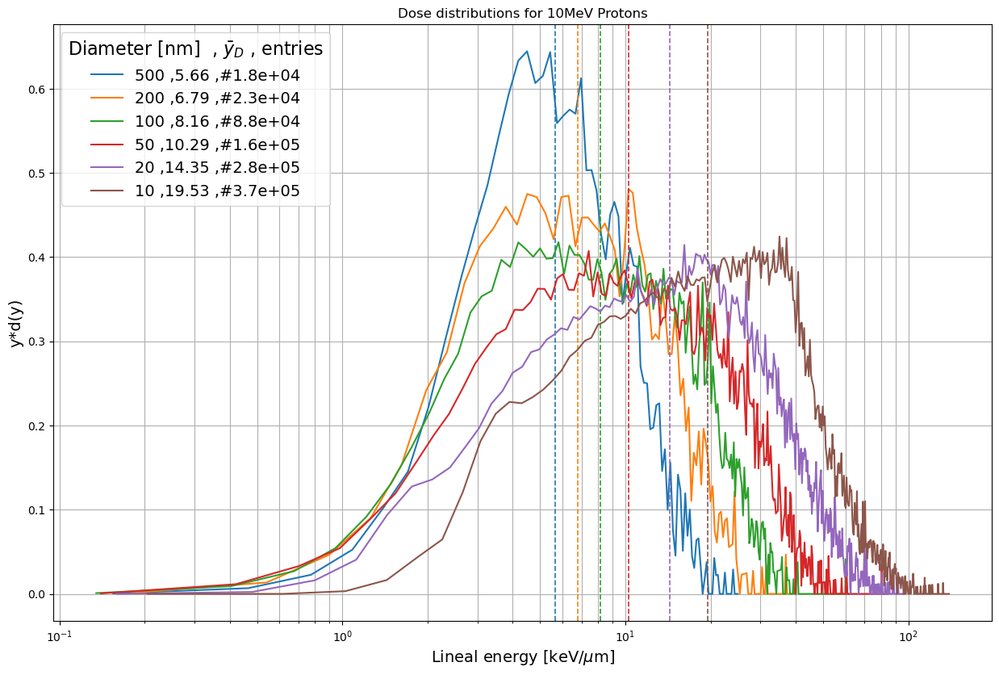

[5.658273418813091, 6.787071118724001, 8.16245645173164, 10.287969056135388, 14.352821206543737, 19.5327516164616]
y_d =  3.961213827512474 for  500 nm
y_d =  5.2055386713559795 for  200 nm
y_d =  6.827117695946621 for  100 nm
y_d =  8.890316370329634 for  50 nm
y_d =  13.242377791670899 for  20 nm
y_d =  18.572129120141927 for  10 nm


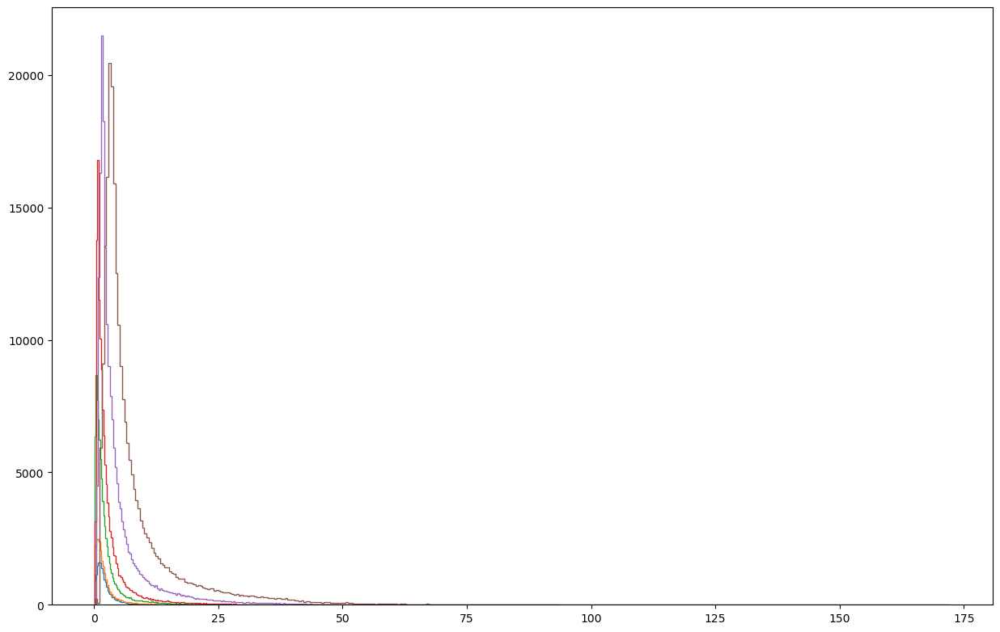

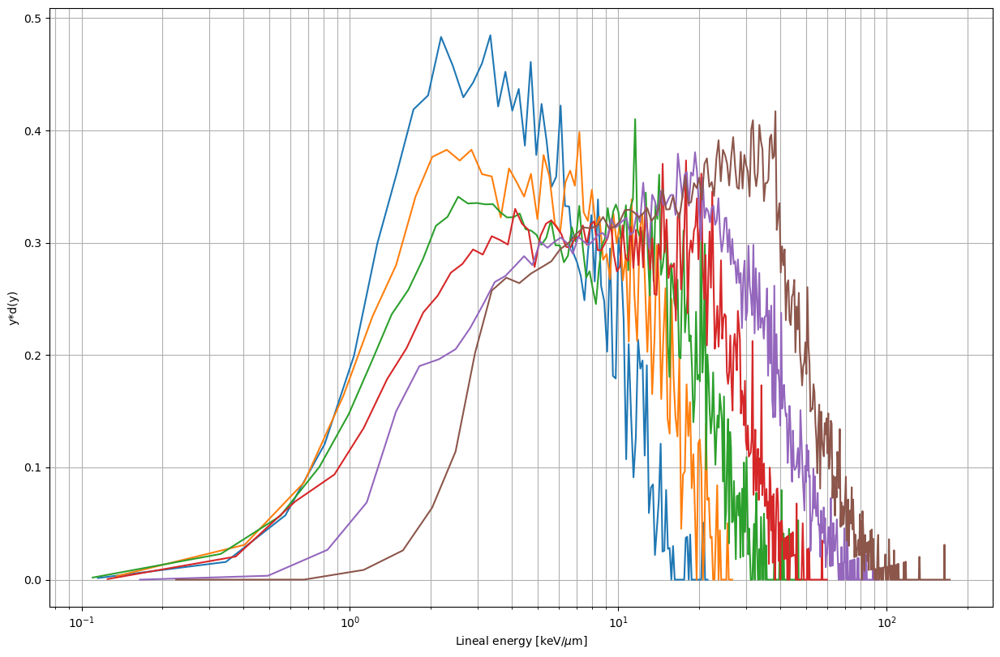

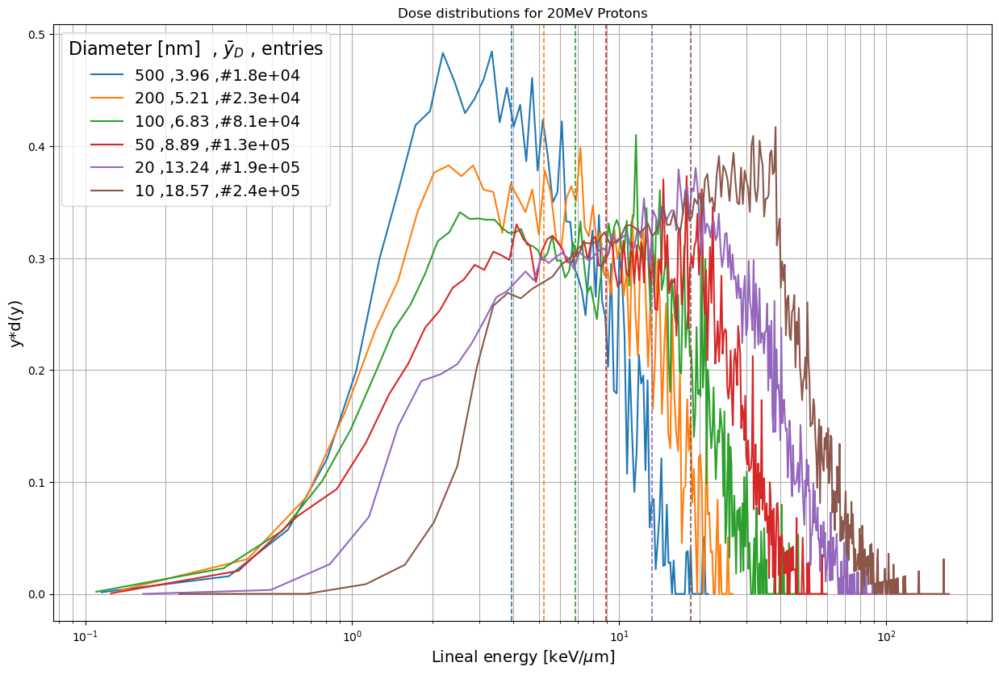

[3.961213827512474, 5.2055386713559795, 6.827117695946621, 8.890316370329634, 13.242377791670899, 18.572129120141927]
y_d =  2.9453727819248448 for  500 nm
y_d =  4.326665439202514 for  200 nm
y_d =  5.988592775996694 for  100 nm
y_d =  8.29462964916945 for  50 nm
y_d =  12.617278173406747 for  20 nm
y_d =  17.80616886784357 for  10 nm


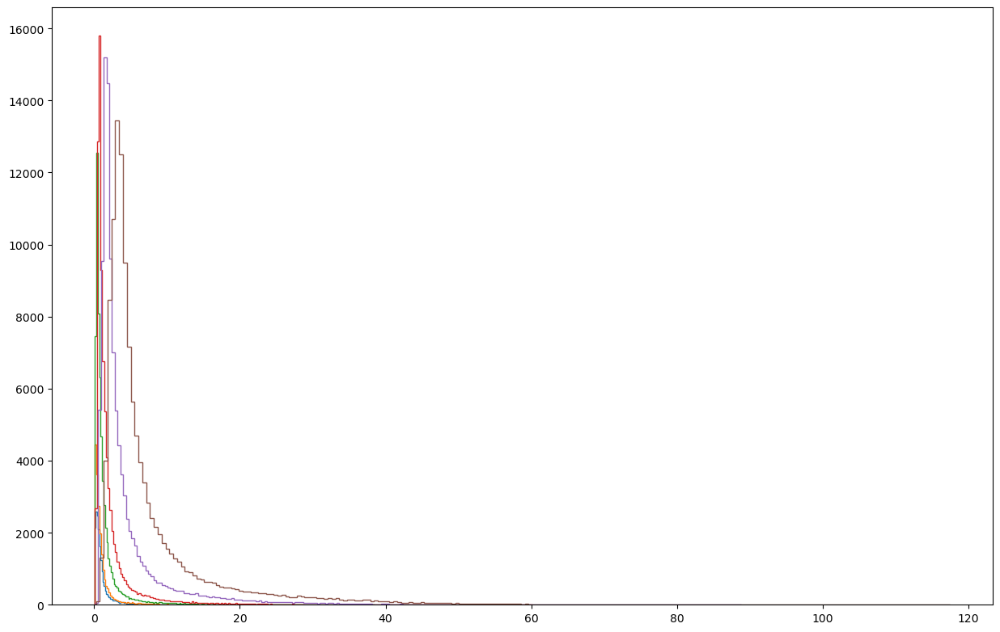

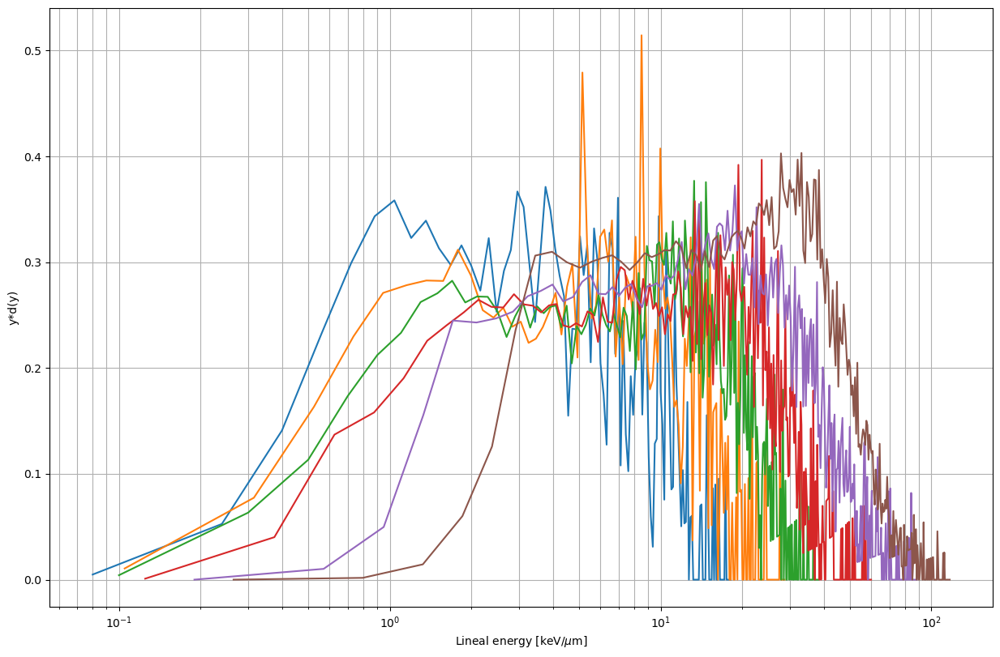

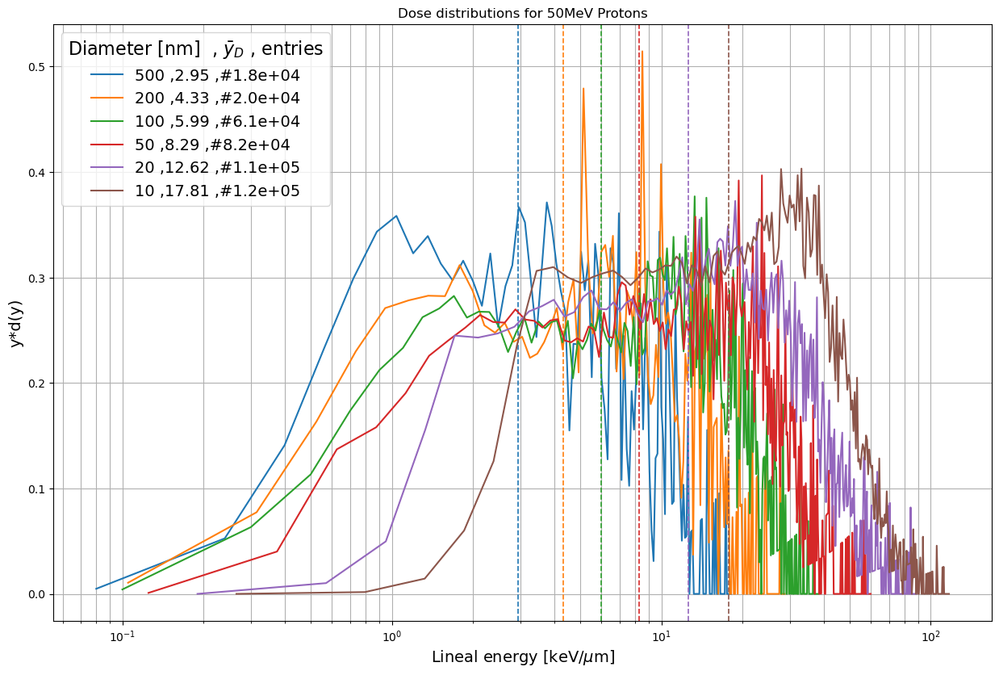

[2.9453727819248448, 4.326665439202514, 5.988592775996694, 8.29462964916945, 12.617278173406747, 17.80616886784357]
y_d =  2.523597129221115 for  500 nm
y_d =  4.213365616971974 for  200 nm
y_d =  5.6952731643978876 for  100 nm
y_d =  7.954299930733786 for  50 nm
y_d =  12.331894940344032 for  20 nm
y_d =  17.72540868137787 for  10 nm


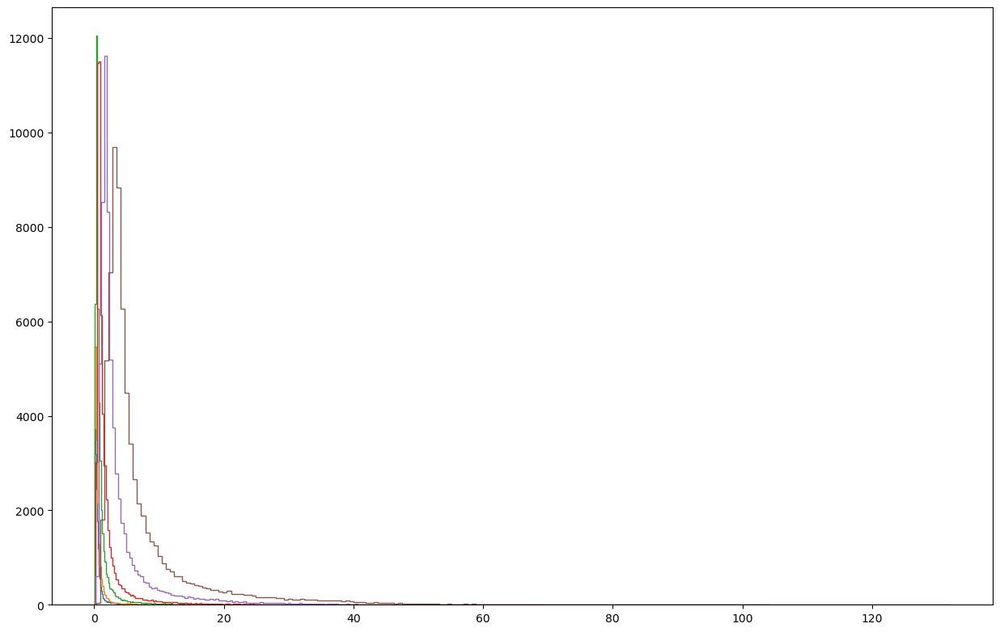

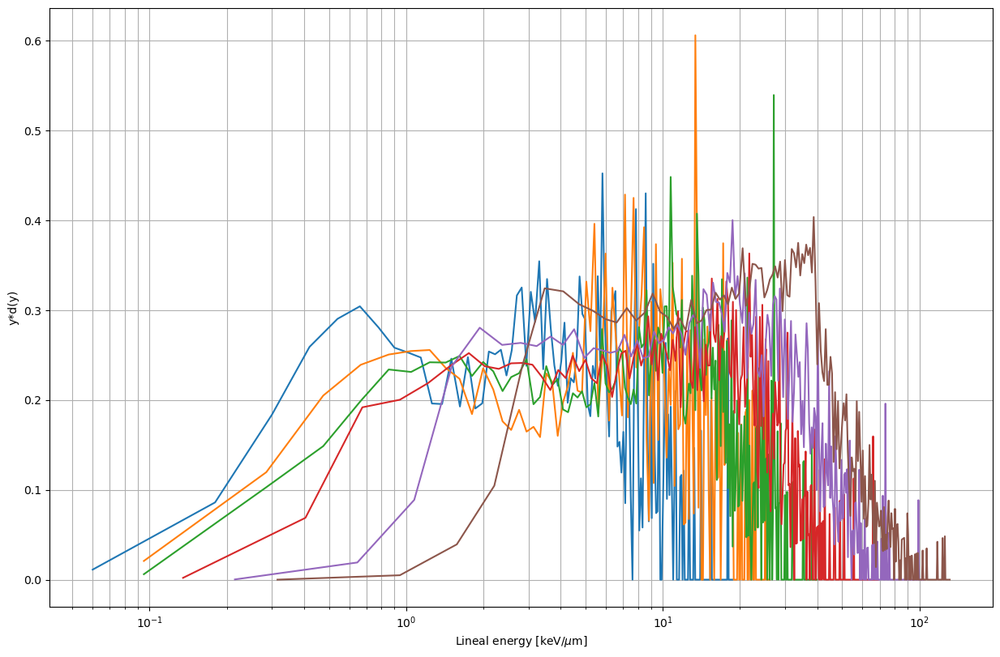

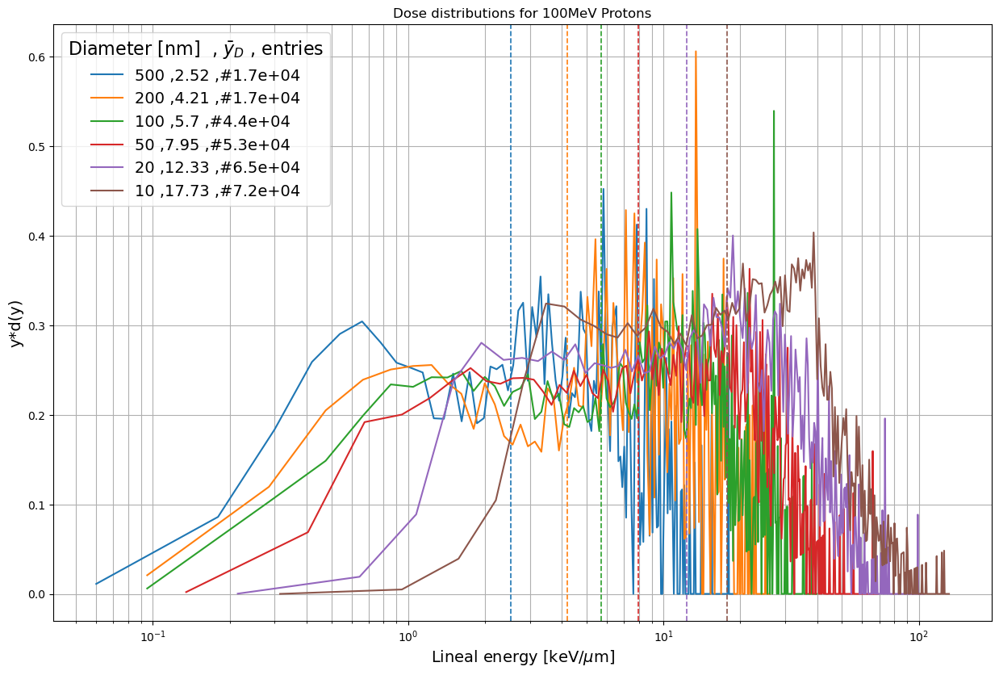

[2.523597129221115, 4.213365616971974, 5.6952731643978876, 7.954299930733786, 12.331894940344032, 17.72540868137787]


,0.50,0.20,0.10,0.05,0.02,0.01
1,24.184696,22.991248,22.073590,20.760134,19.467795,20.075366
2,13.706381,13.002923,12.518300,12.144039,12.275571,14.131665
5,6.454737,6.240003,6.151278,6.313211,7.588781,10.330411
10,3.649282,3.602645,3.694237,4.111556,5.875757,8.935943
20,2.066452,2.124873,2.318651,2.919842,4.952237,8.144300
50,1.017256,1.130295,1.466811,2.199909,4.319116,7.542017
100,0.611865,0.777866,1.145062,1.898058,4.008517,7.251643


In [12]:
yd_df = pd.DataFrame(columns=[0.5, 0.2, 0.1, 0.05, 0.02, 0.01])
yf_df = pd.DataFrame(columns=[0.5, 0.2, 0.1, 0.05, 0.02, 0.01])
for e in [1, 2, 5, 10, 20, 50, 100]:
    ydy_list, yf_list = ydyplots500nm(e, [500, 200, 100, 50, 20, 10]); 
    print(ydy_list)
    yd_df.loc[e]=ydy_list
    yf_df.loc[e]=yf_list
yf_df

In [13]:
yd_df.transpose().to_csv('yd_dfs/0.5um.csv')
yf_df.transpose().to_csv('yd_dfs/yf_0.5um.csv')

In [14]:
def ydyplots2um(e, lst):
    plt.figure(1)
    plt.xlabel('Lineal energy [KeV]')
    plt.ylabel('y*d(y)')
    plt.xscale('log')
    sim_d=2
    yd_list2um=[]
    yf_list2um= []
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6']
    col=0

    for nm in lst:
        
        ybins, yd_y, entries, yd, yf = integrals(e,nm,sim_d);
        scientific_entries = "{:.1e}".format(entries)
        plt.figure(1)
        plt.plot(ybins[:-1],yd_y, linewidth=1.5, label = f'{nm} ,{yd.round(2)} ,#{scientific_entries}', color=colors[col] )
        plt.axvline(x=yd,color=colors[col], linestyle='--', lw=1.2 )
        yd_list2um.append(yd)
        yf_list2um.append(yf)
        col+=1
        
    plt.figure(1)
    #shift = max([t.get_window_extent().width for t in legend.get_texts()])#kommentert ut av kristina test
   
    plt.legend(loc="upper left", fontsize=8)
    
    plt.title(f'yd(y) spectrum {e}MeV')
    
    plt.show()
    return yd_list2um, yf_list2um

y_d =  1.575609123834095 for  2000 nm
y_d =  1.9910894263403622 for  1000 nm
y_d =  2.65333663476203 for  500 nm
y_d =  4.412070802381241 for  200 nm
y_d =  7.238094430277909 for  100 nm


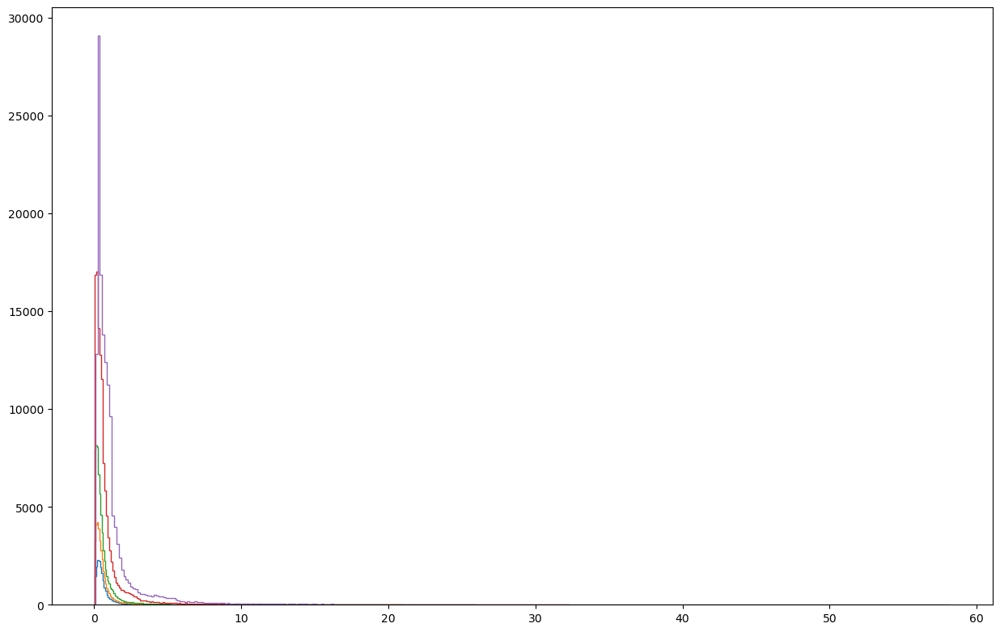

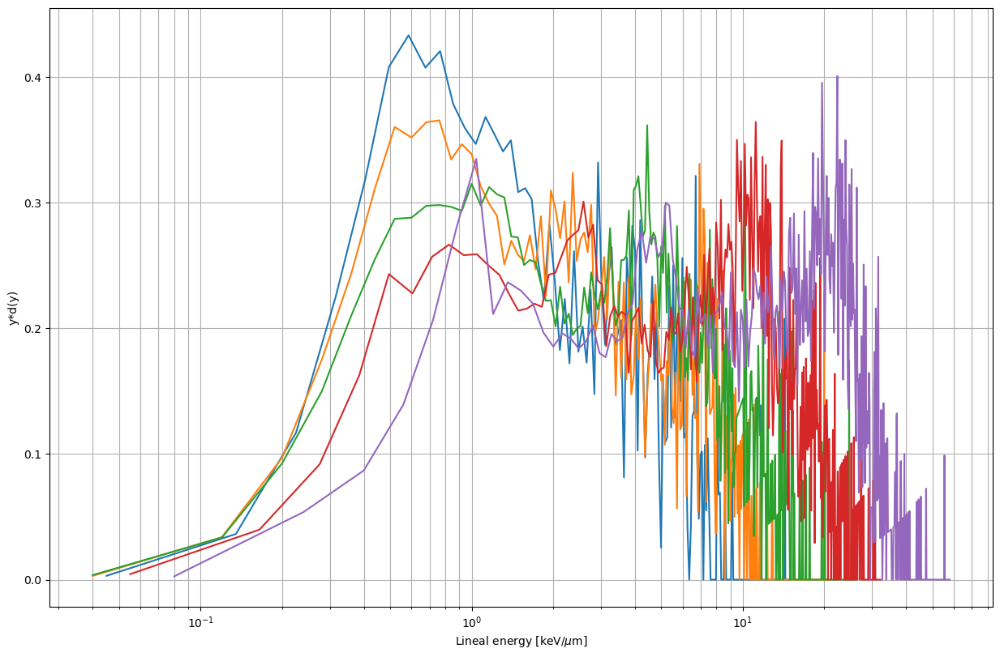

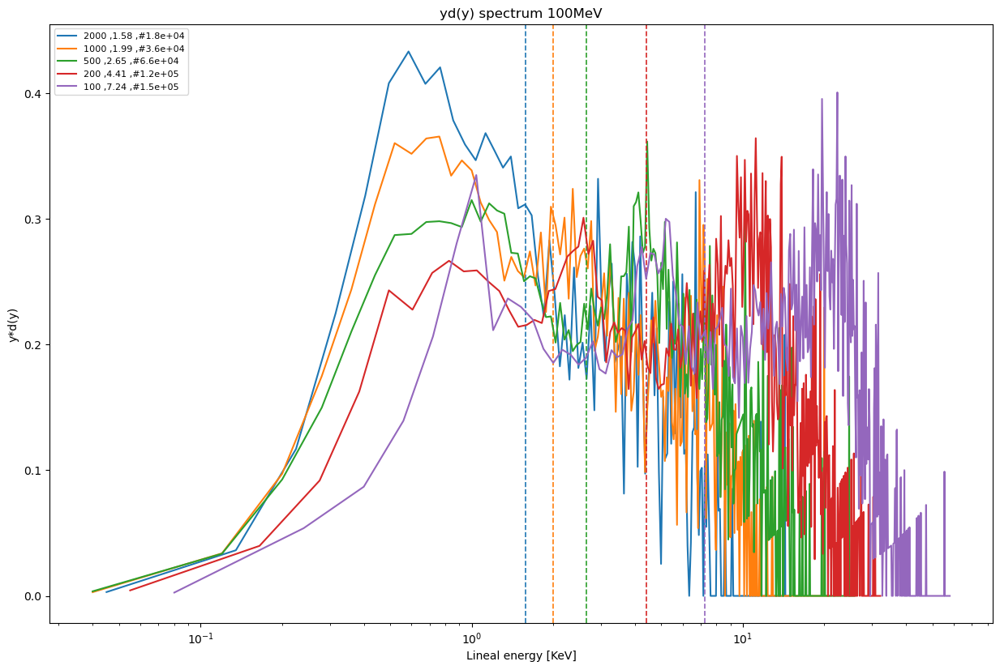

([1.575609123834095,
  1.9910894263403622,
  2.65333663476203,
  4.412070802381241,
  7.238094430277909],
 [0.6133348360193844,
  0.624828459590145,
  0.6703471805984592,
  0.9028917498058422,
  1.3717596390773594])

In [15]:
ydyplots2um(100, [2000, 1000, 500, 200, 100])

y_d =  30.35764472410455 for  2000 nm
y_d =  31.093551105381675 for  1000 nm
y_d =  31.678344294563143 for  500 nm
y_d =  34.201653120796756 for  200 nm
y_d =  37.748629477146814 for  100 nm


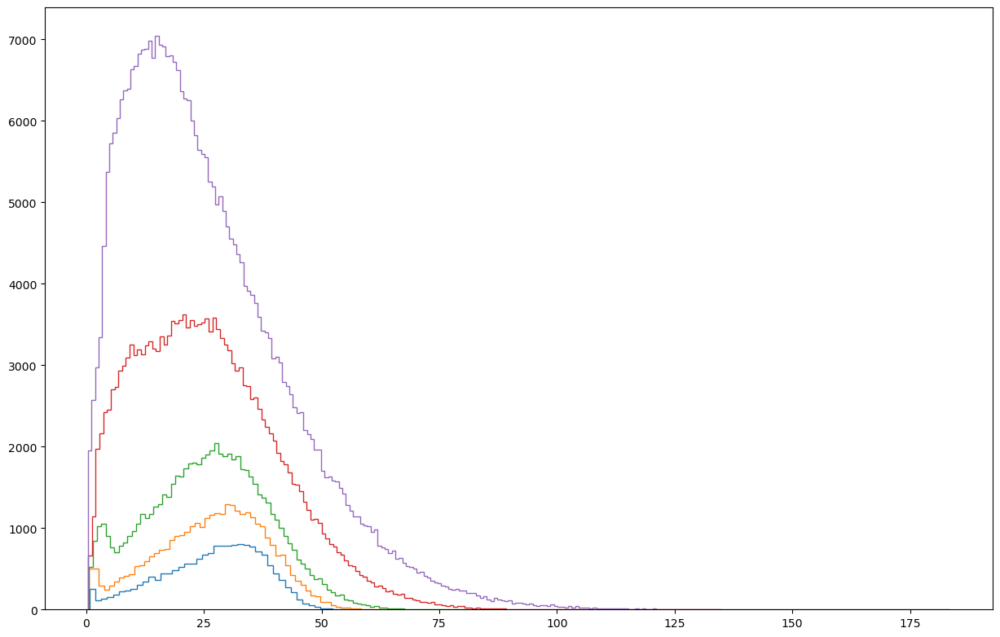

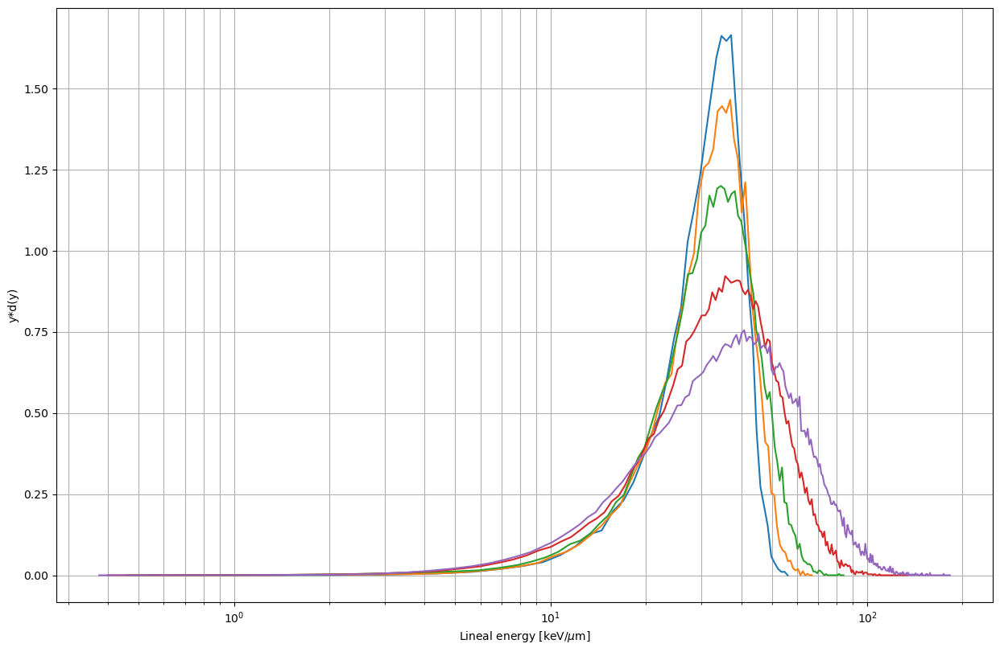

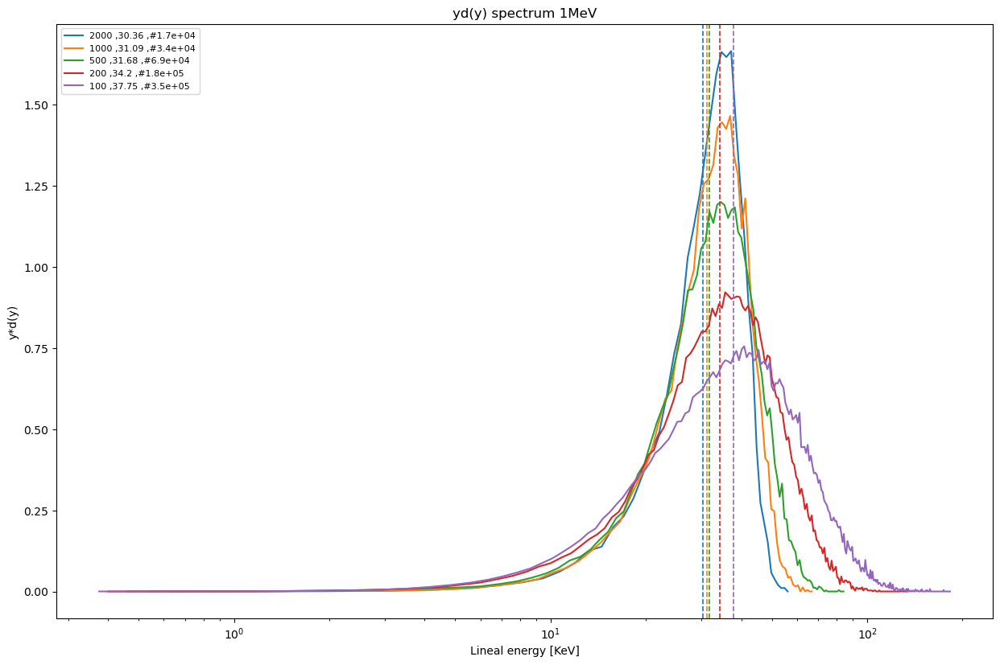

[30.35764472410455, 31.093551105381675, 31.678344294563143, 34.201653120796756, 37.748629477146814]
y_d =  18.423009980628642 for  2000 nm
y_d =  19.040115016027155 for  1000 nm
y_d =  19.99449775535841 for  500 nm
y_d =  22.50527564419635 for  200 nm
y_d =  27.25496739869776 for  100 nm


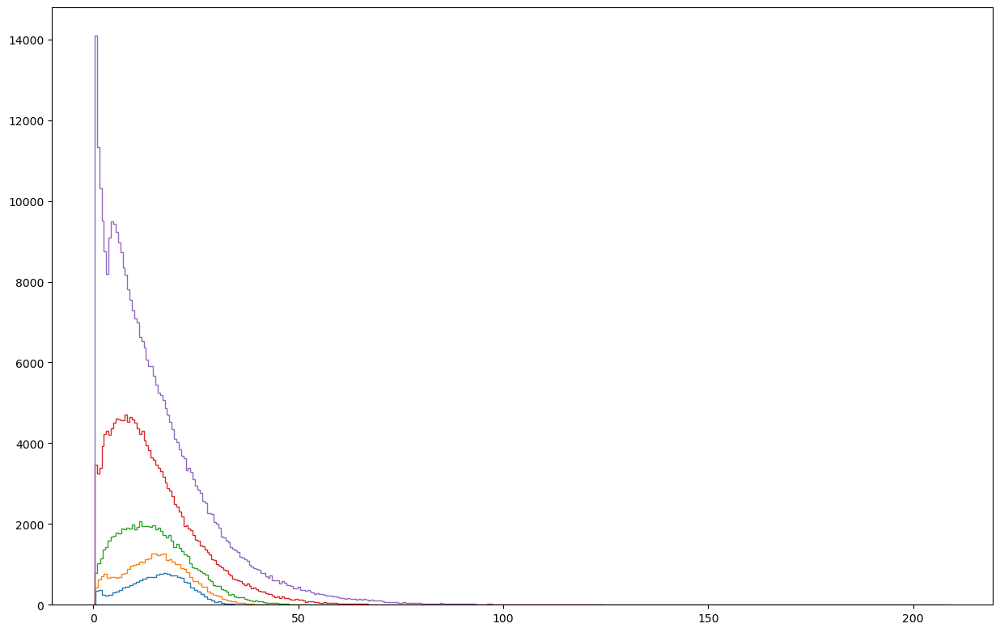

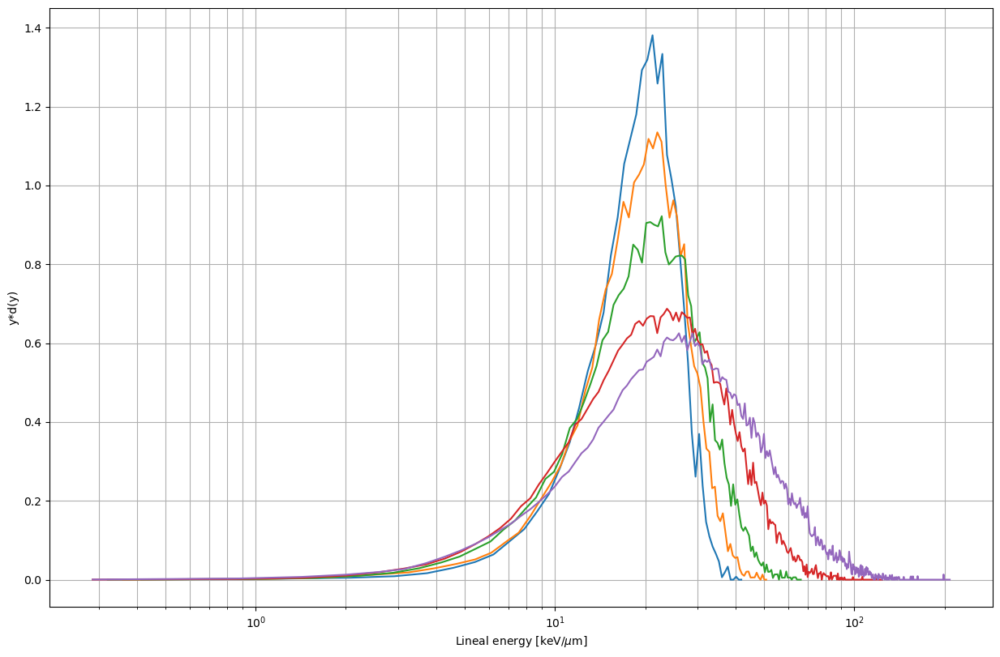

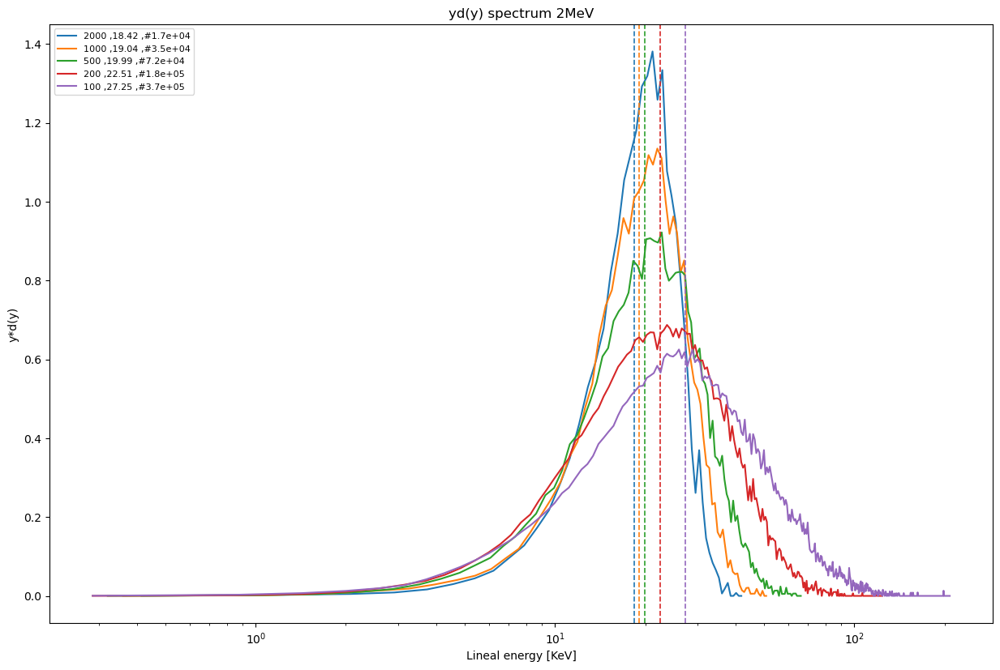

[18.423009980628642, 19.040115016027155, 19.99449775535841, 22.50527564419635, 27.25496739869776]
y_d =  9.084459417880888 for  2000 nm
y_d =  9.087129789230977 for  1000 nm
y_d =  9.3378791890652 for  500 nm
y_d =  10.466667990329164 for  200 nm
y_d =  12.53821212518758 for  100 nm


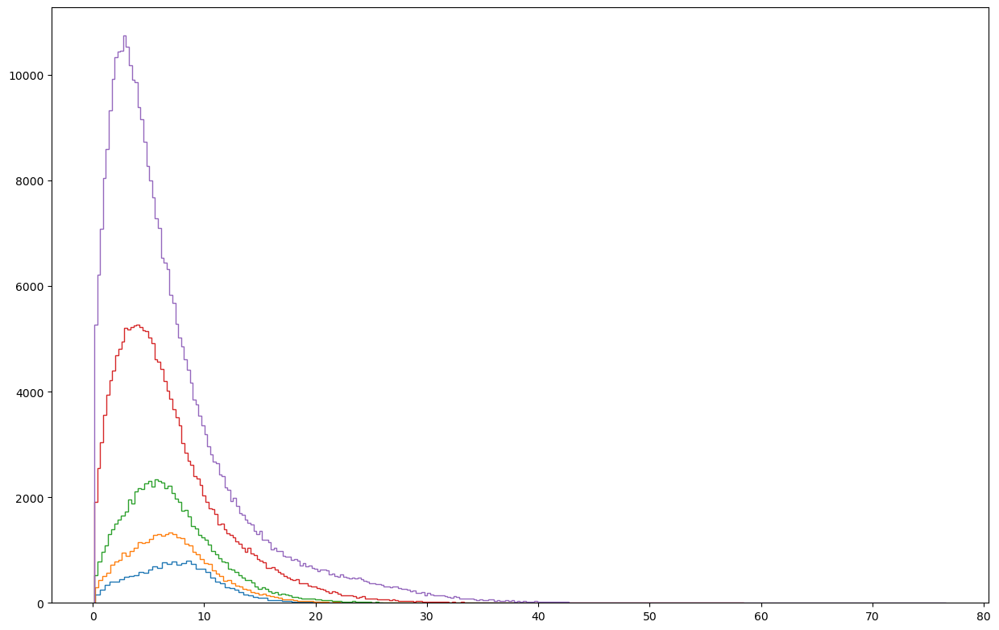

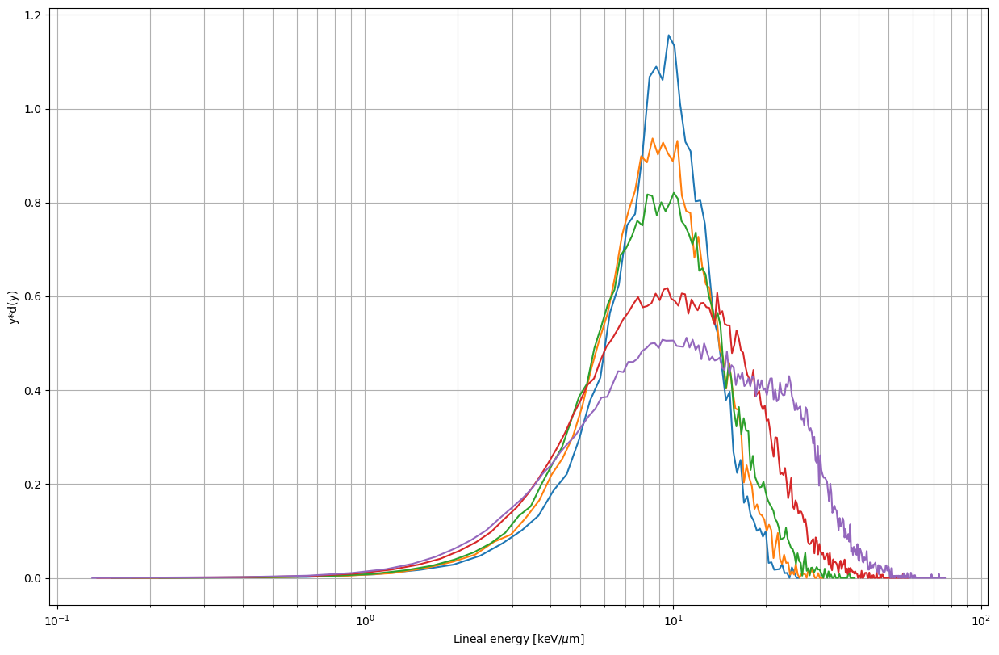

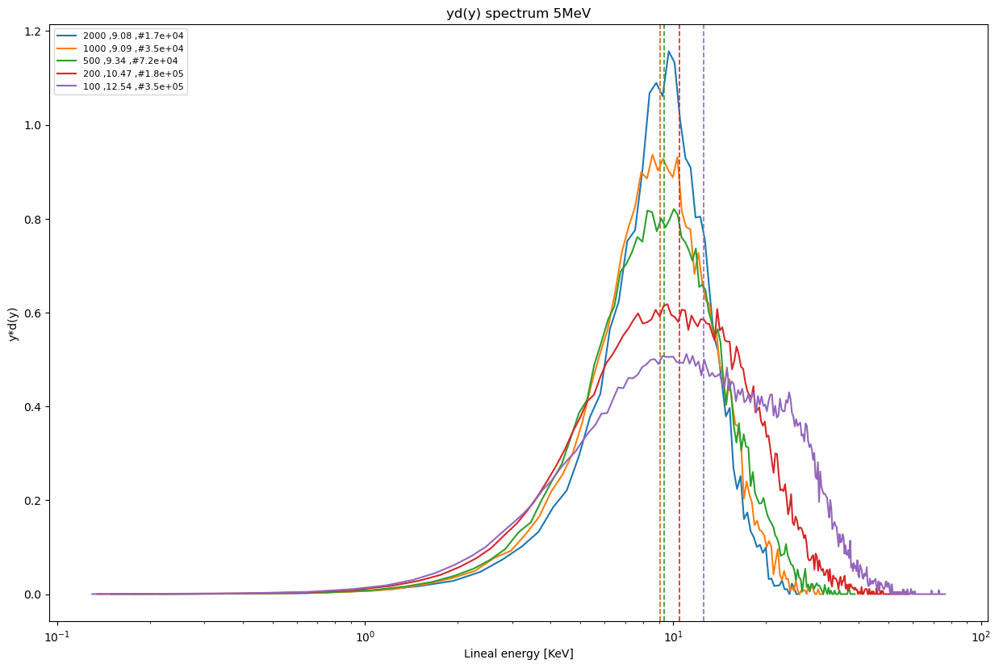

[9.084459417880888, 9.087129789230977, 9.3378791890652, 10.466667990329164, 12.53821212518758]
y_d =  5.166206714924091 for  2000 nm
y_d =  5.423177592472272 for  1000 nm
y_d =  5.8898255314176575 for  500 nm
y_d =  7.311755987364934 for  200 nm
y_d =  9.681069710868003 for  100 nm


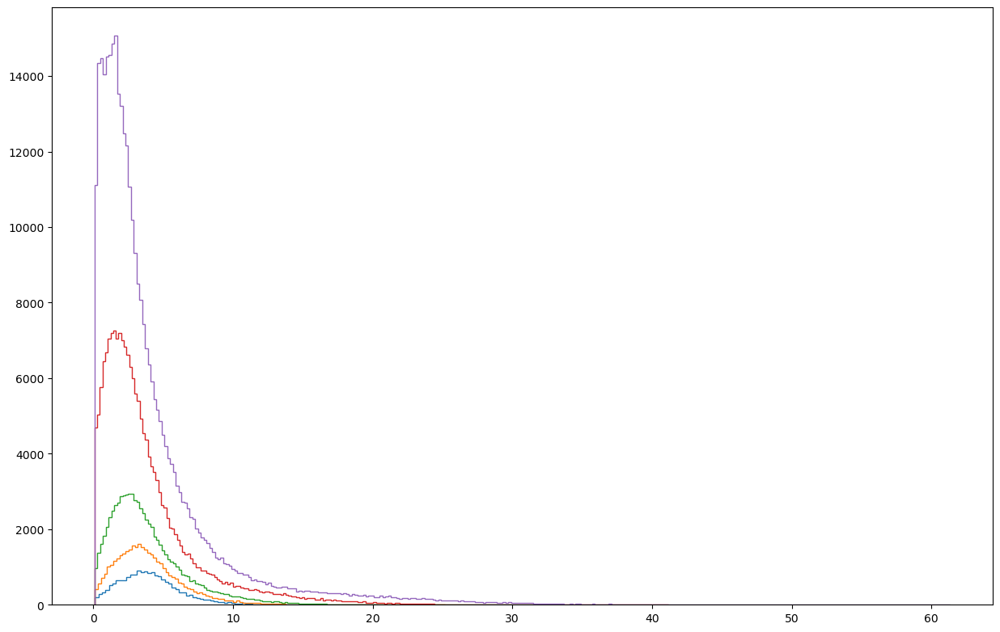

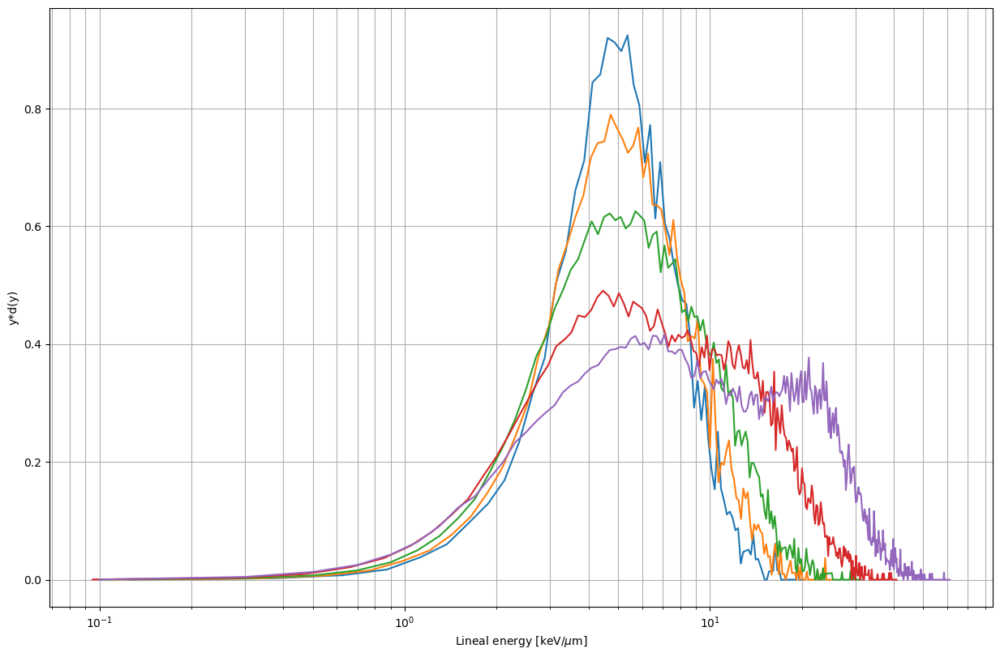

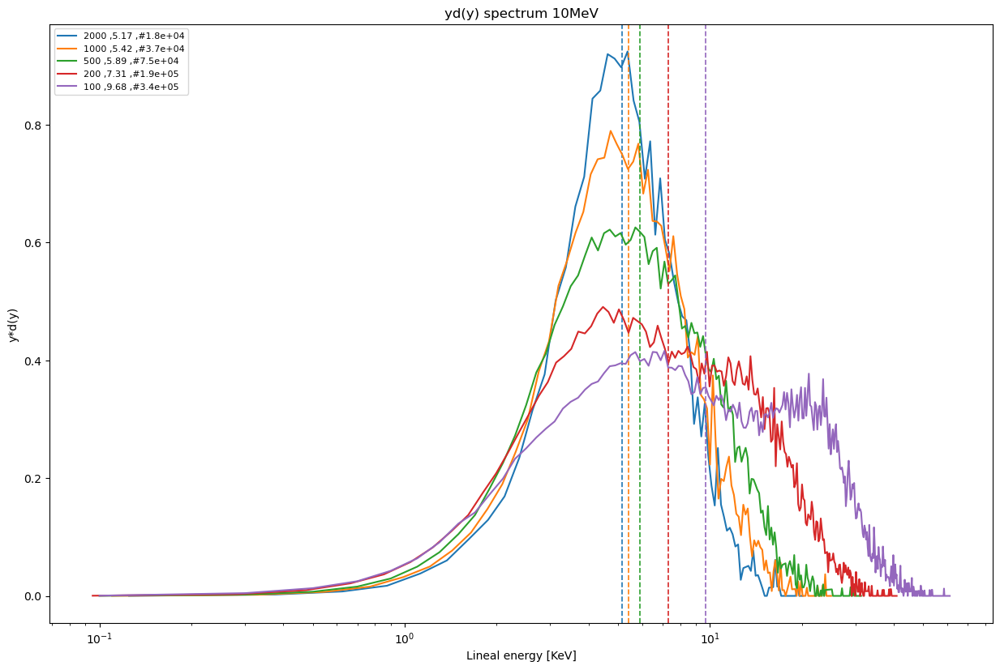

[5.166206714924091, 5.423177592472272, 5.8898255314176575, 7.311755987364934, 9.681069710868003]
y_d =  3.151972080580369 for  2000 nm
y_d =  3.535758469364238 for  1000 nm
y_d =  4.186622914750699 for  500 nm
y_d =  5.816609390732637 for  200 nm
y_d =  8.334350264505902 for  100 nm


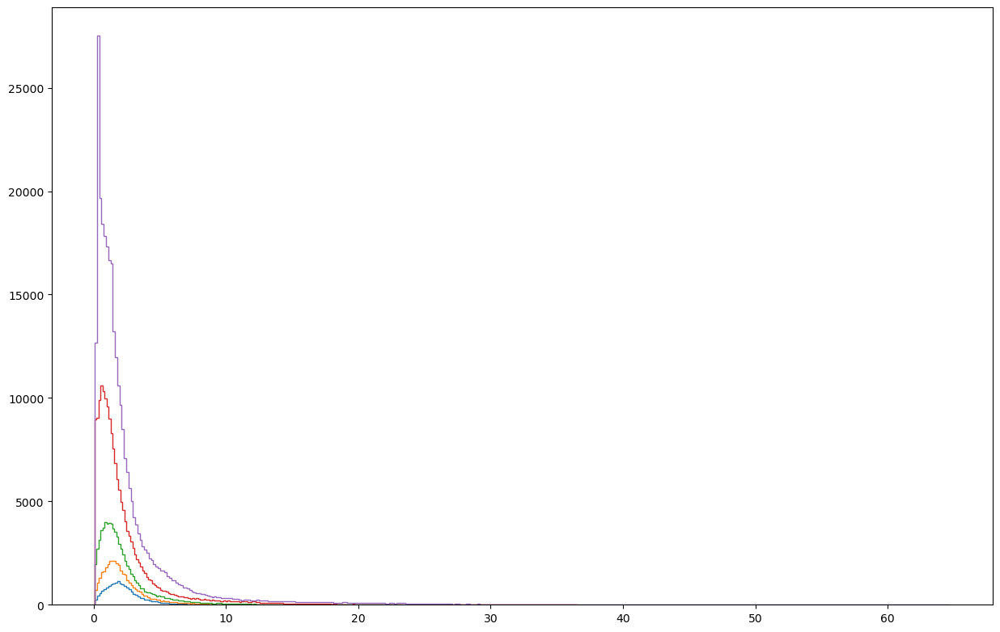

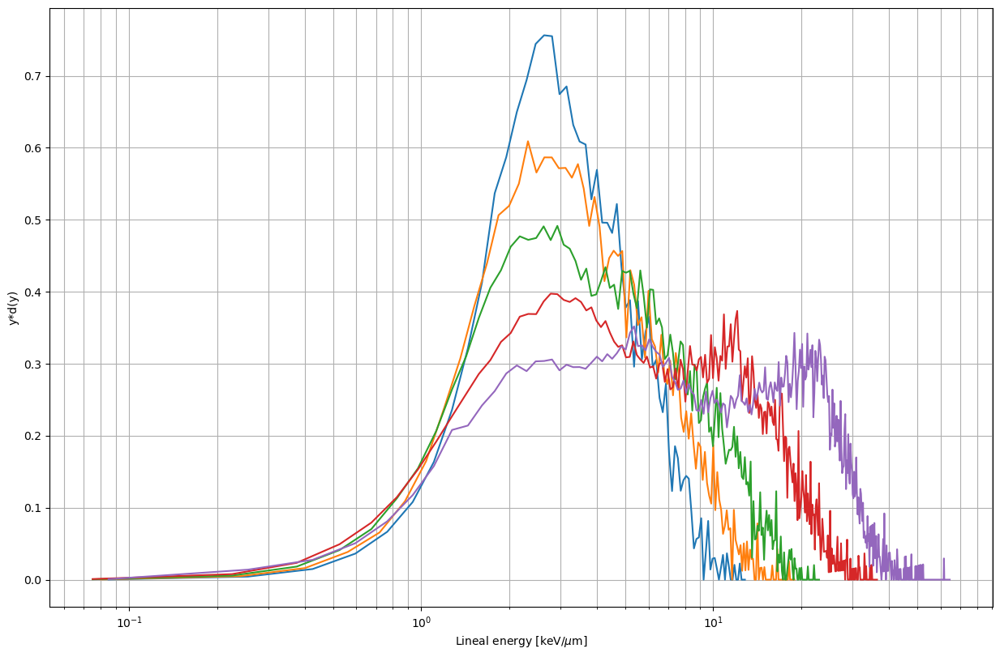

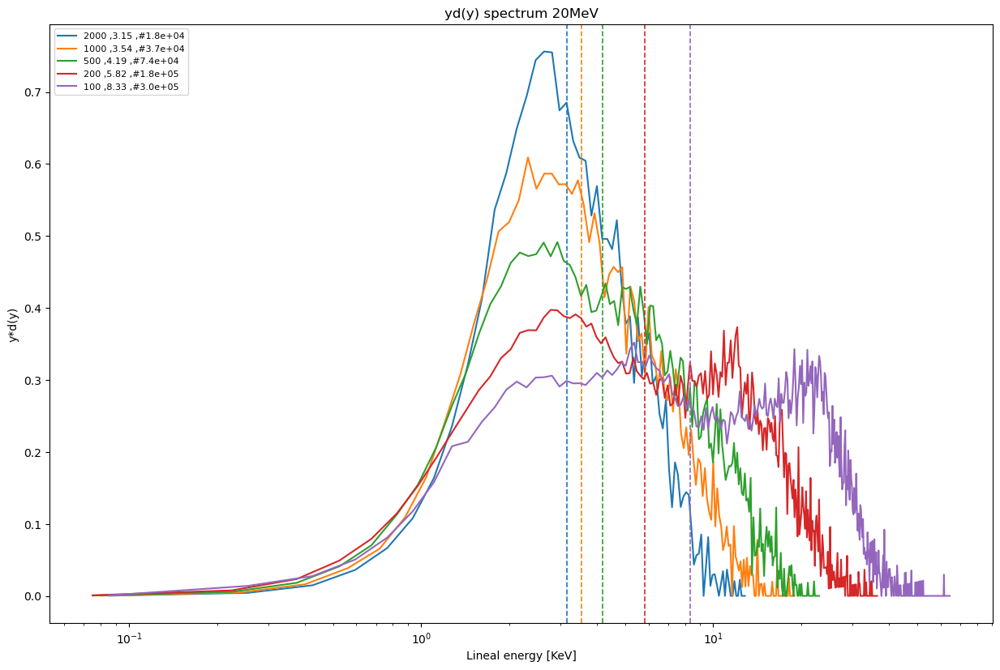

[3.151972080580369, 3.535758469364238, 4.186622914750699, 5.816609390732637, 8.334350264505902]
y_d =  1.971514240140101 for  2000 nm
y_d =  2.3916758266409444 for  1000 nm
y_d =  3.0266563112560076 for  500 nm
y_d =  4.758410422851507 for  200 nm
y_d =  7.299467655399981 for  100 nm


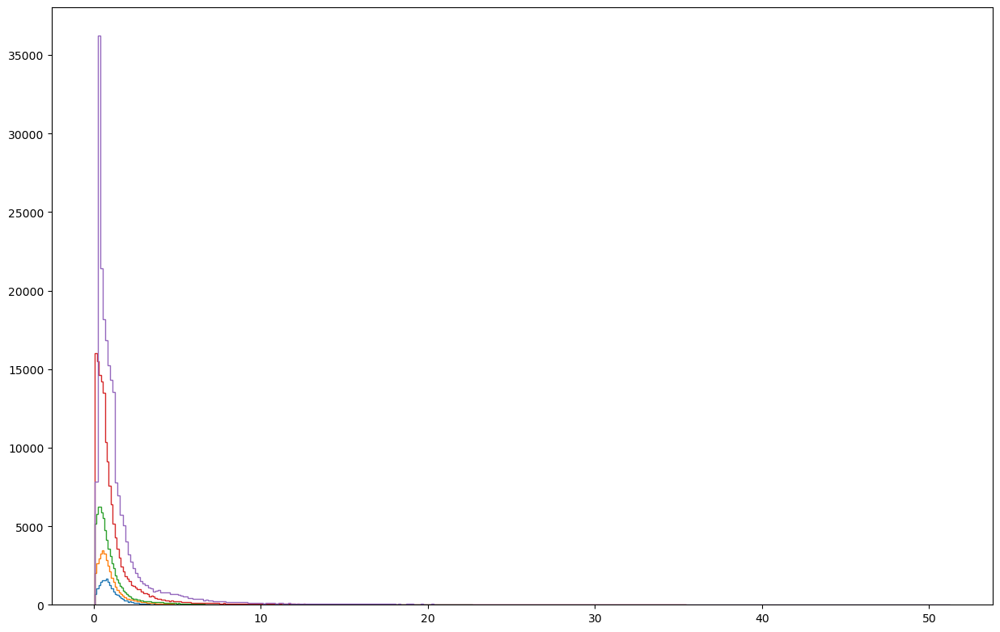

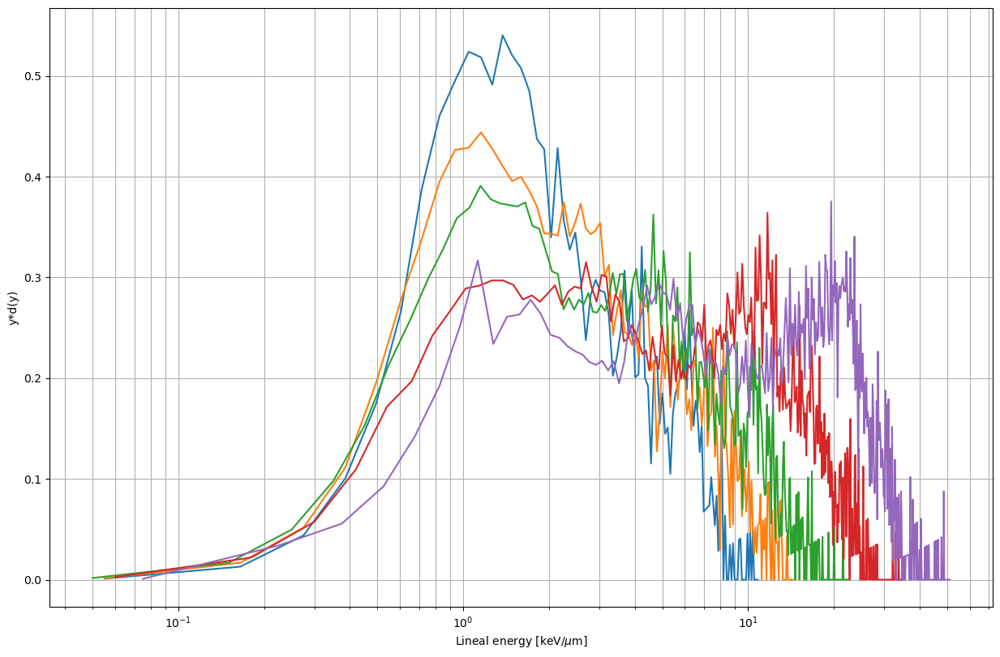

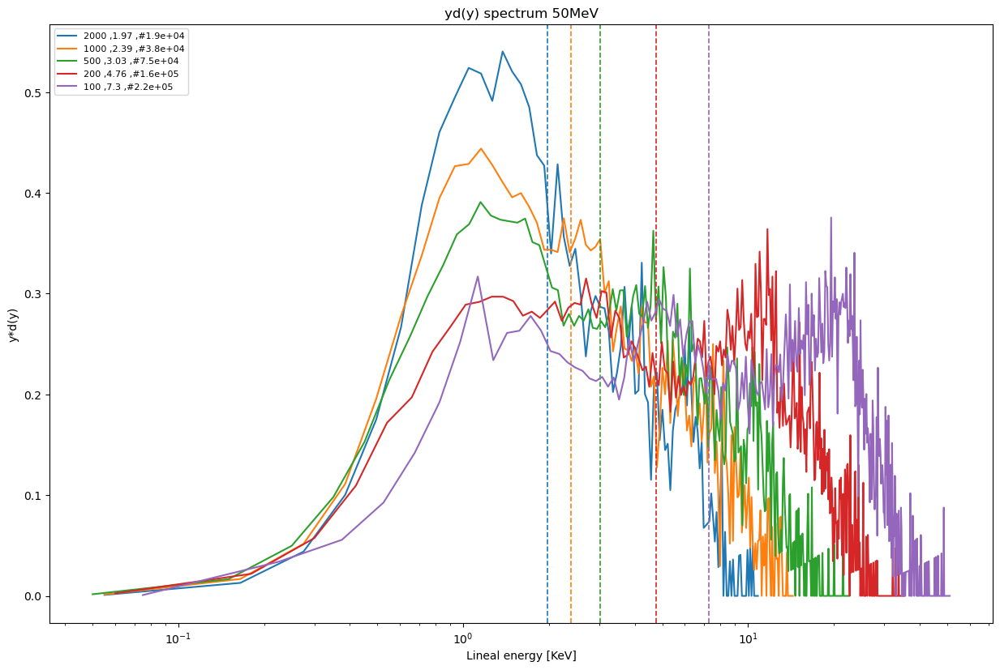

[1.971514240140101, 2.3916758266409444, 3.0266563112560076, 4.758410422851507, 7.299467655399981]
y_d =  1.575609123834095 for  2000 nm
y_d =  1.9910894263403622 for  1000 nm
y_d =  2.65333663476203 for  500 nm
y_d =  4.412070802381241 for  200 nm
y_d =  7.238094430277909 for  100 nm


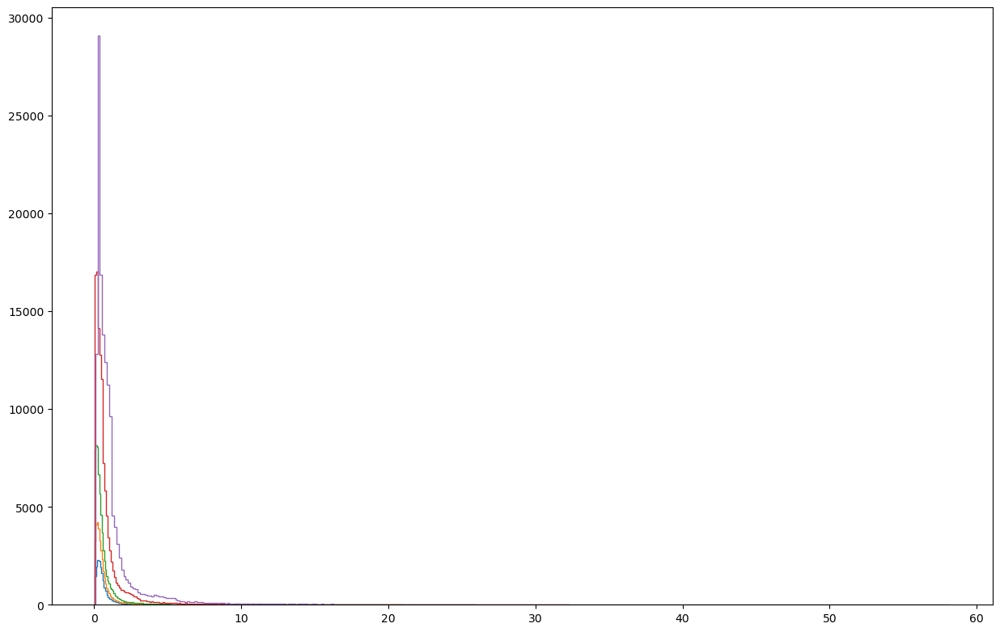

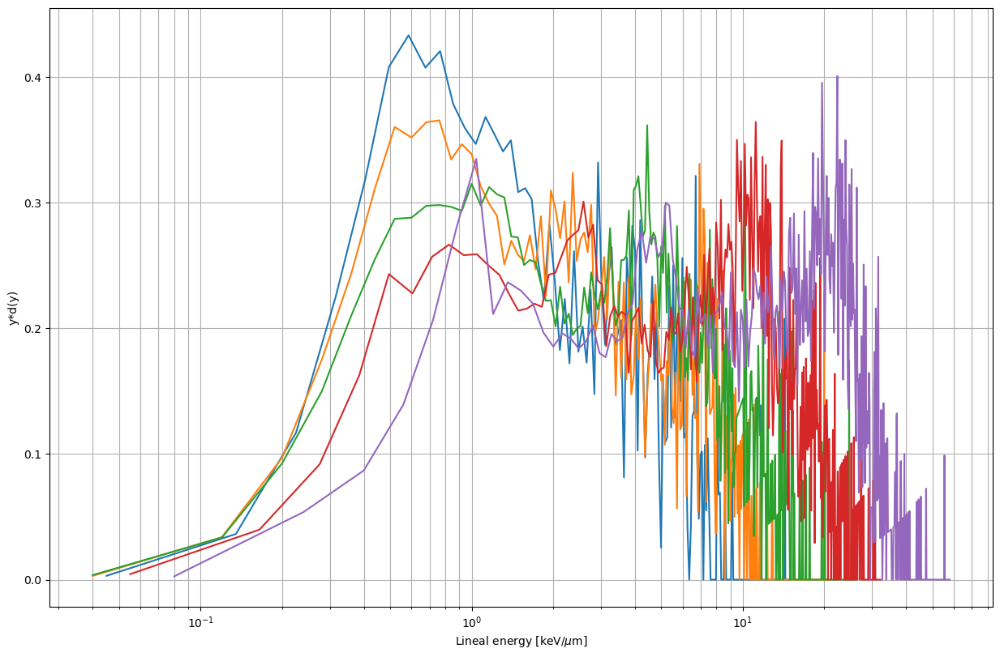

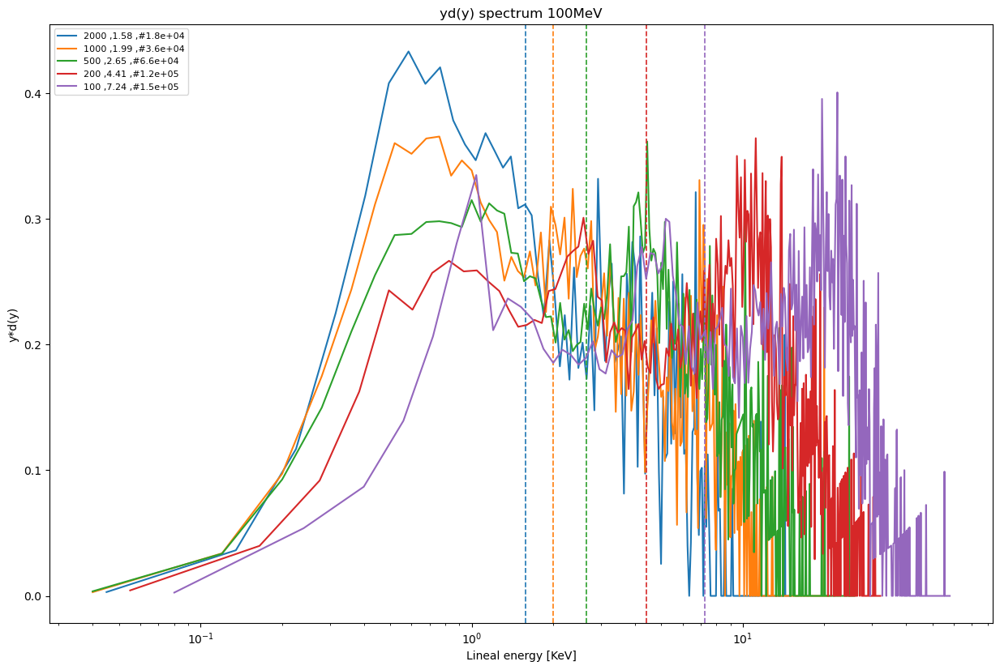

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]


,1,2,5,10,20,50,100
2.0,30.357645,18.423010,9.084459,5.166207,3.151972,1.971514,1.575609
1.0,31.093551,19.040115,9.087130,5.423178,3.535758,2.391676,1.991089
0.5,31.678344,19.994498,9.337879,5.889826,4.186623,3.026656,2.653337
0.2,34.201653,22.505276,10.466668,7.311756,5.816609,4.758410,4.412071
0.1,37.748629,27.254967,12.538212,9.681070,8.334350,7.299468,7.238094


In [16]:
yd_df2 = pd.DataFrame(columns=[2, 1, 0.5, 0.2, 0.1])
yf_df2 = pd.DataFrame(columns=[2, 1, 0.5, 0.2, 0.1])
for e in [1, 2, 5, 10, 20, 50, 100]:
    ydy_list2um,yf_list2um = ydyplots2um(e, [2000,1000, 500, 200, 100]);
    print(ydy_list2um)
    yd_df2.loc[e]=ydy_list2um
    yf_df2.loc[e]=yf_list2um
yd_df2.transpose()

In [17]:
yf_df2.transpose()

,1,2,5,10,20,50,100
2.0,26.013238,15.032875,7.173263,3.914887,2.198975,1.042604,0.613335
1.0,25.946506,14.841719,6.929013,3.860968,2.178968,1.043093,0.624828
0.5,25.392688,14.597764,6.823702,3.799116,2.184901,1.063631,0.670347
0.2,25.317001,14.443812,6.708547,3.785539,2.265784,1.248113,0.902892
0.1,25.689162,14.899801,6.898499,4.049107,2.578910,1.685296,1.371760


In [18]:
yd_df2.transpose().to_csv('yd_dfs/2um.csv')
yf_df2.transpose().to_csv('yd_dfs/yf_2um.csv')

In [19]:
def ydyplots20um(e, lst):
    plt.figure(1)
    plt.xlabel('Lineal energy [KeV]')
    plt.ylabel('y*d(y)')
    plt.xscale('log')
    sim_d=20
    yd_list20um=[]
    yf_list20um=[]
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6']
    col=0

    for nm in lst:
        
        ybins, yd_y, entries, yd, yf = integrals(e,nm,sim_d);
        scientific_entries = "{:.1e}".format(entries)
        plt.figure(1)
        plt.plot(ybins[:-1],yd_y, linewidth=1.5, label = f'{nm} ,{yd.round(2)} ,#{scientific_entries}', color=colors[col] )
        plt.axvline(x=yd,color=colors[col], linestyle='--', lw=1.2 )
        yd_list20um.append(yd)
        yf_list20um.append(yf)
        col+=1
        
    plt.figure(1)
    plt.legend(loc="upper left", fontsize=8)
    plt.title(f'yd(y) spectrum {e}MeV')
    
    plt.show()
    return yd_list20um, yf_list20um

y_d =  39.91225132182099 for  20000 nm
y_d =  32.97132350010985 for  10000 nm
y_d =  31.114412498340144 for  5000 nm


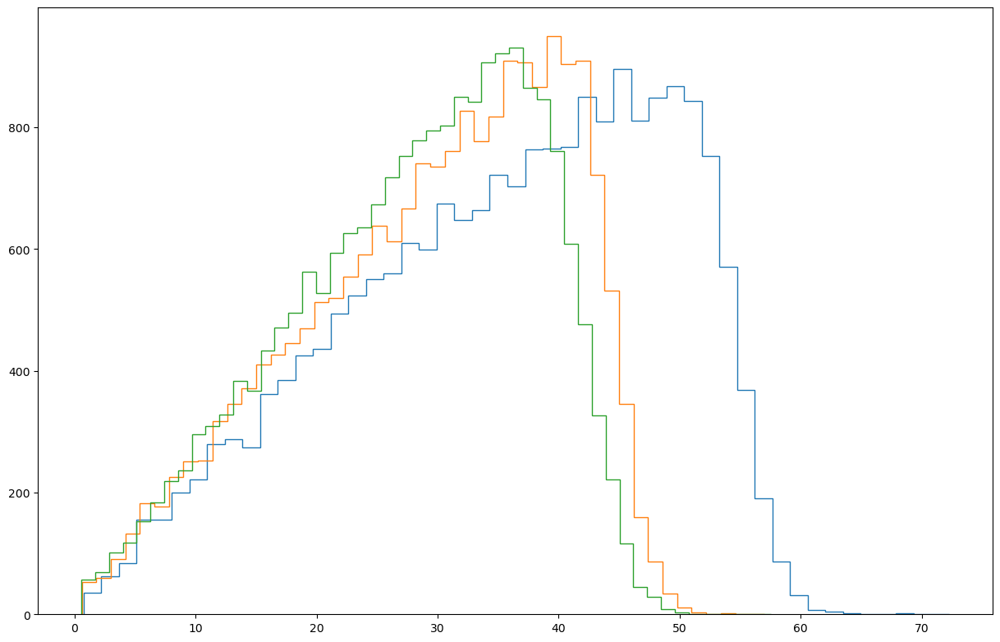

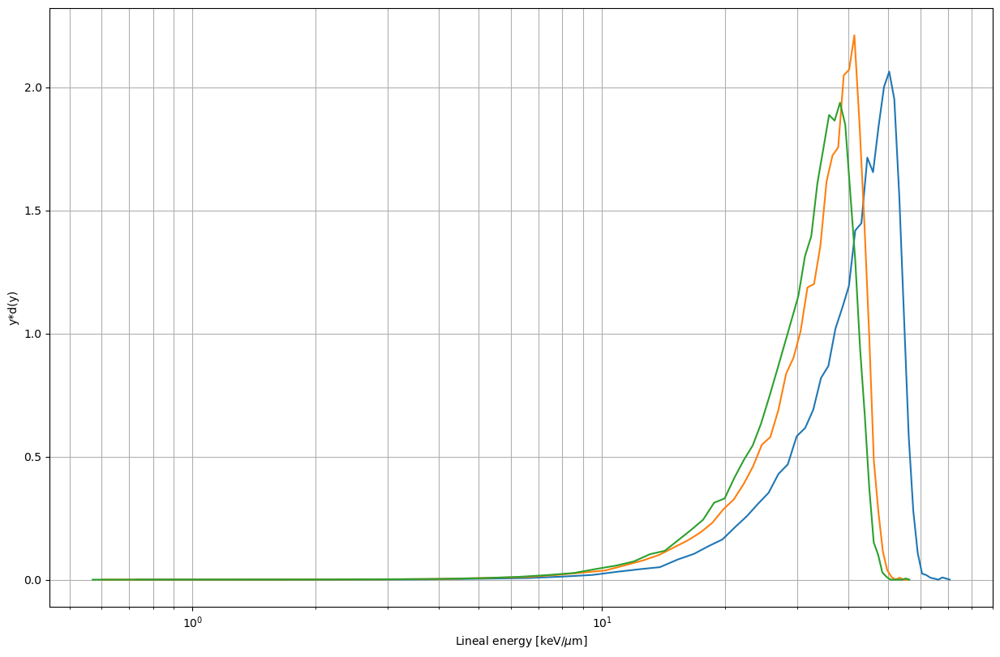

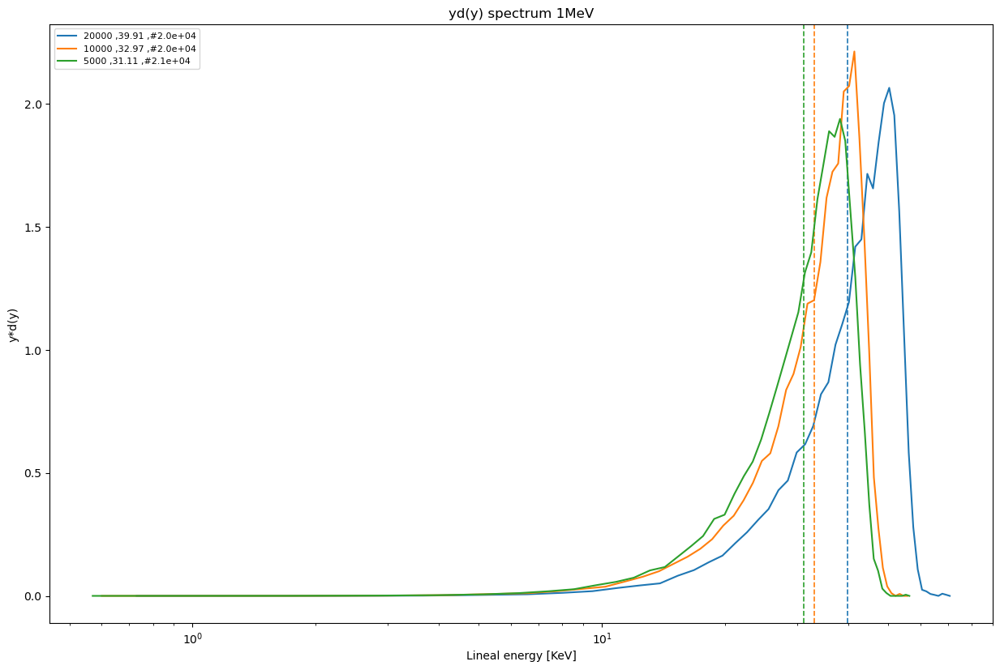

([39.91225132182099, 32.97132350010985, 31.114412498340144],
 [34.89682756586709, 28.927188531454746, 27.309175883331715])

In [20]:
ydyplots20um(1, [20000, 10000, 5000])#, 2000, 1000])

y_d =  39.91225132182099 for  20000 nm
y_d =  32.97132350010985 for  10000 nm
y_d =  31.114412498340144 for  5000 nm


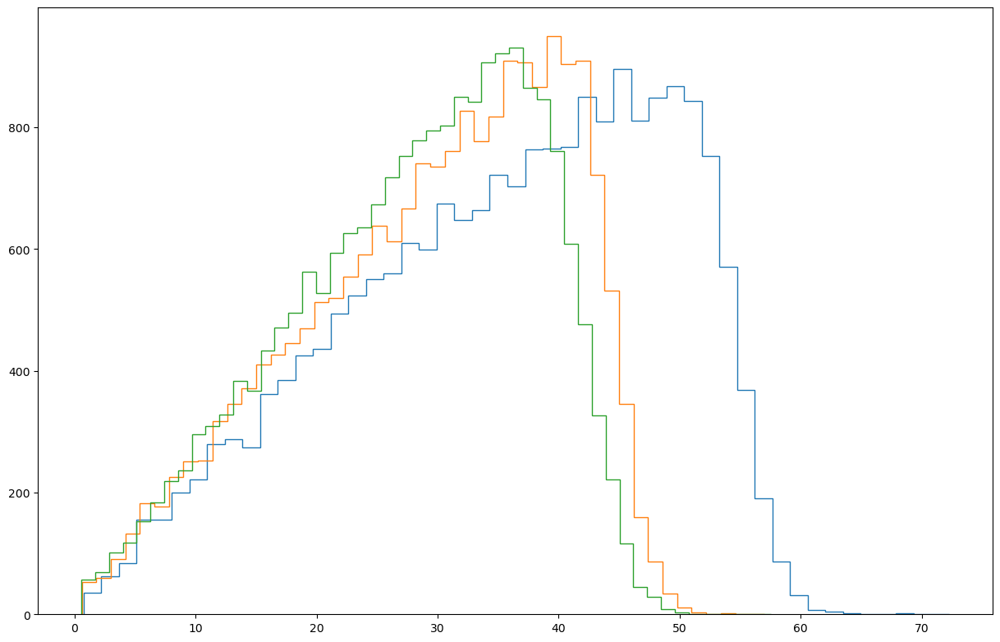

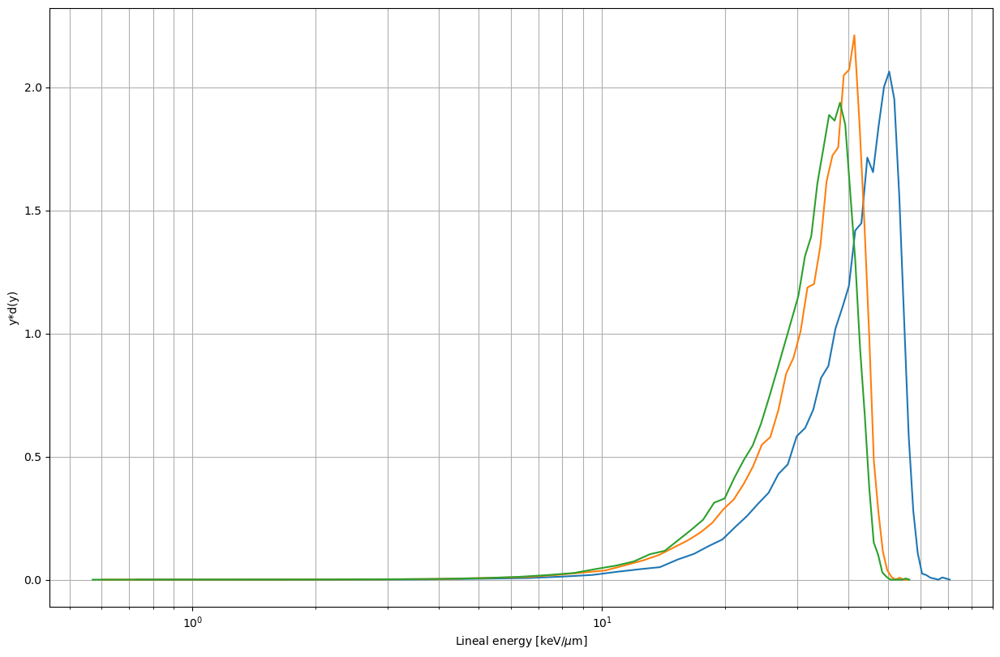

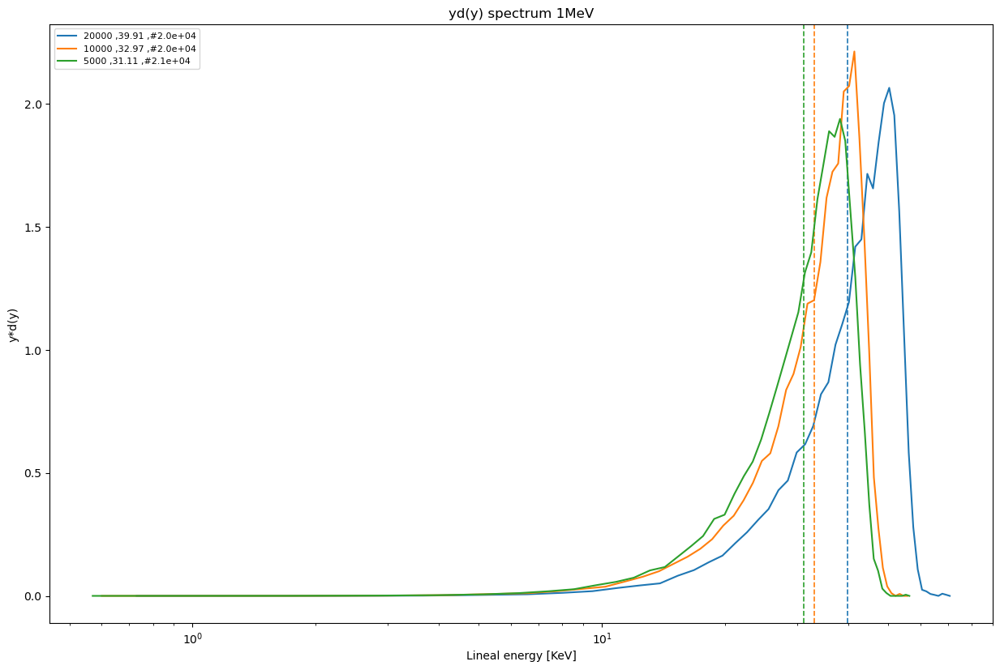

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  18.875714921886928 for  20000 nm
y_d =  19.101878655130424 for  10000 nm
y_d =  19.29121850748126 for  5000 nm


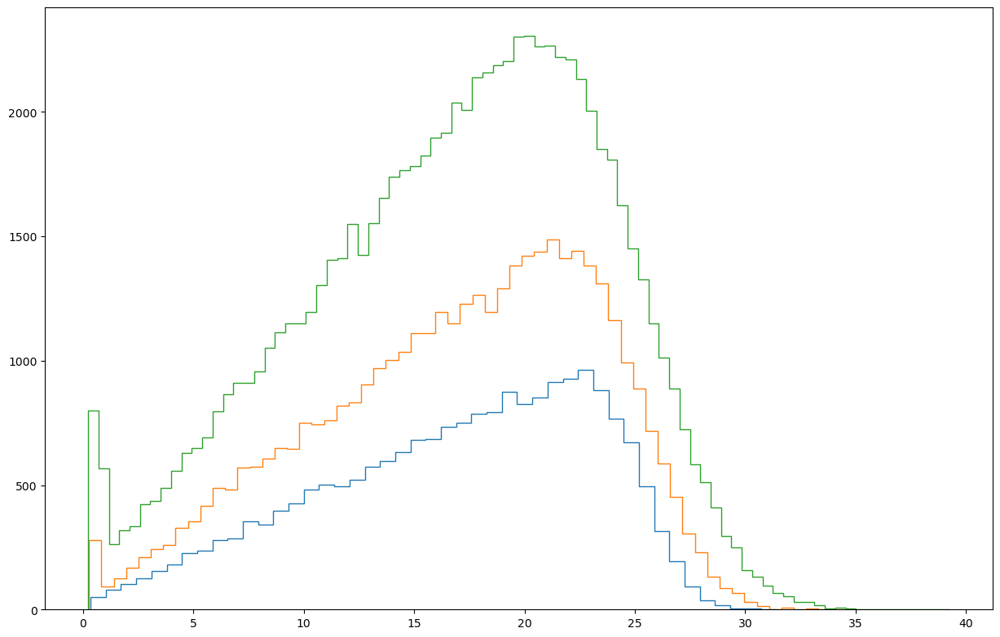

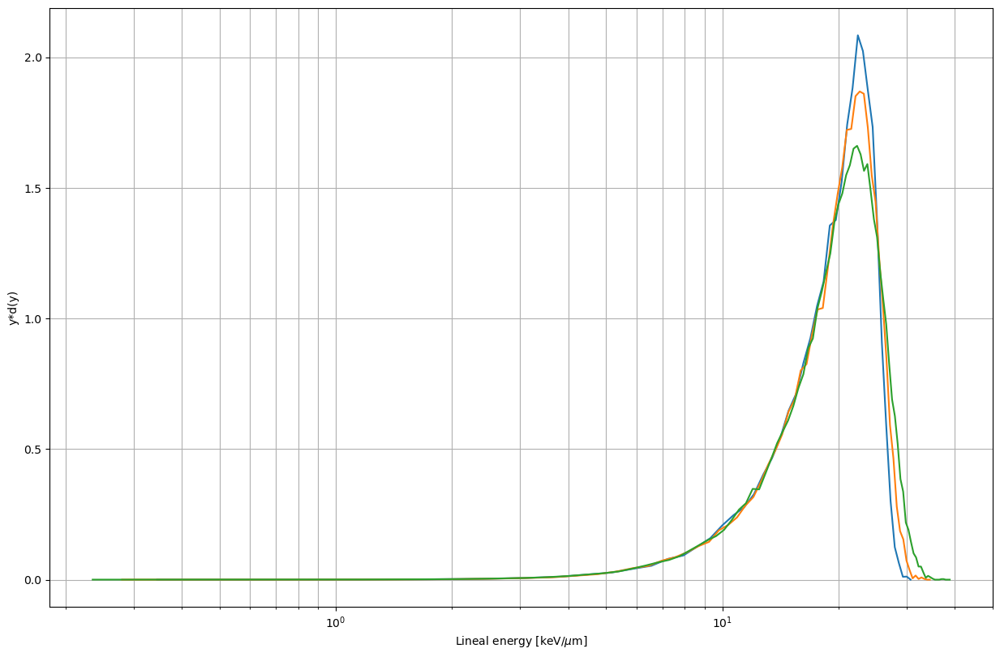

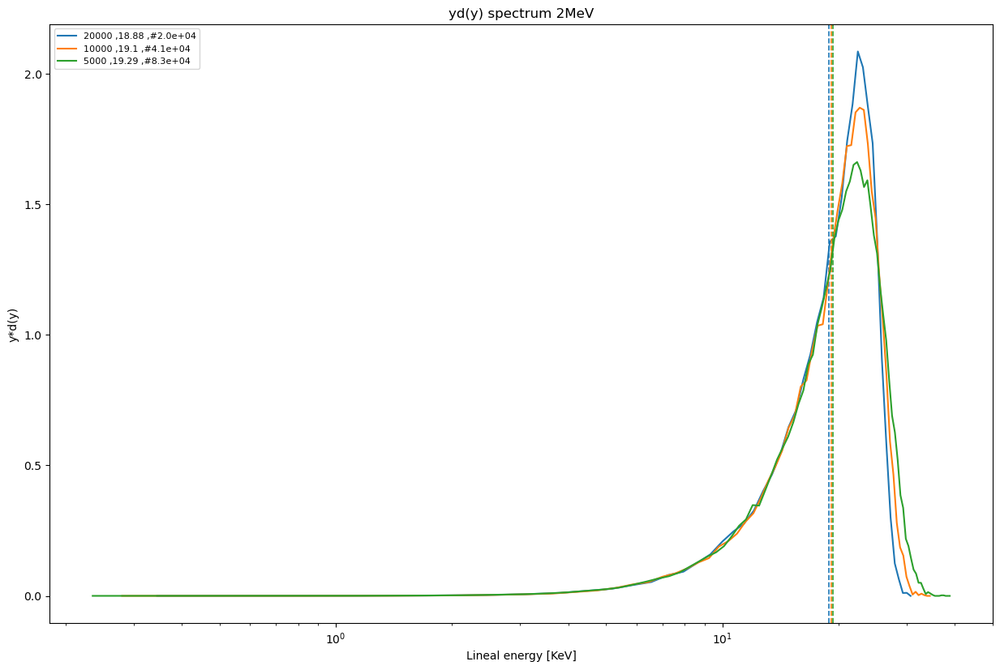

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  9.015830044660982 for  20000 nm
y_d =  9.097307252342047 for  10000 nm
y_d =  9.203885317308176 for  5000 nm


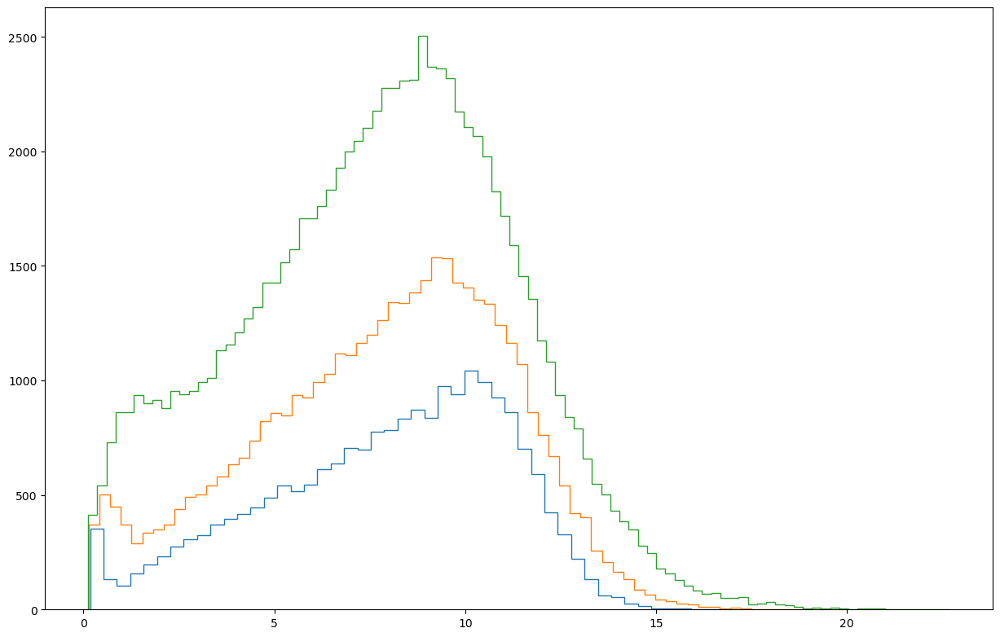

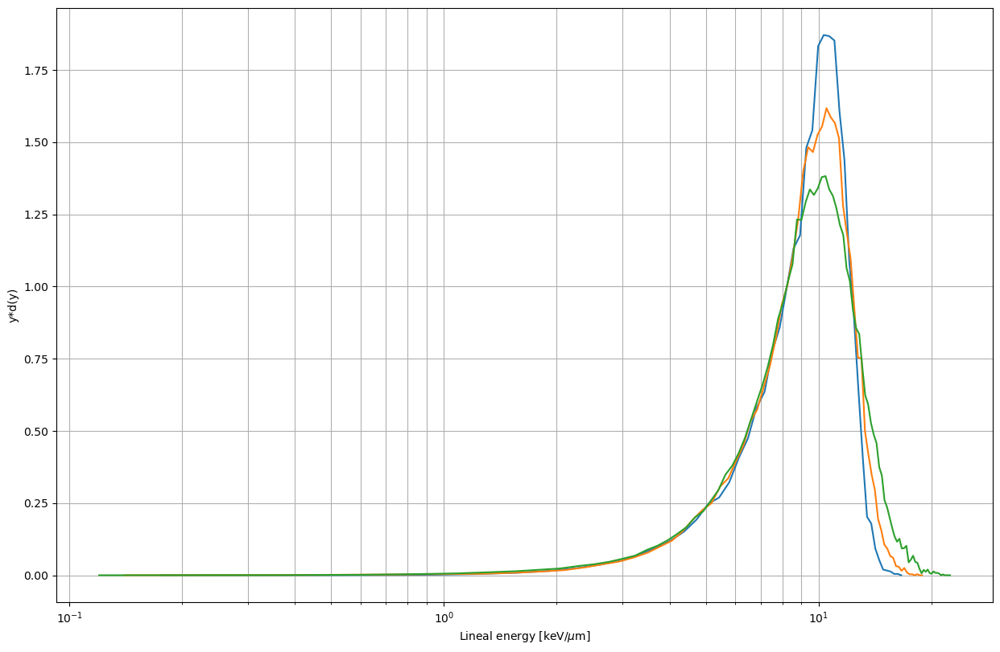

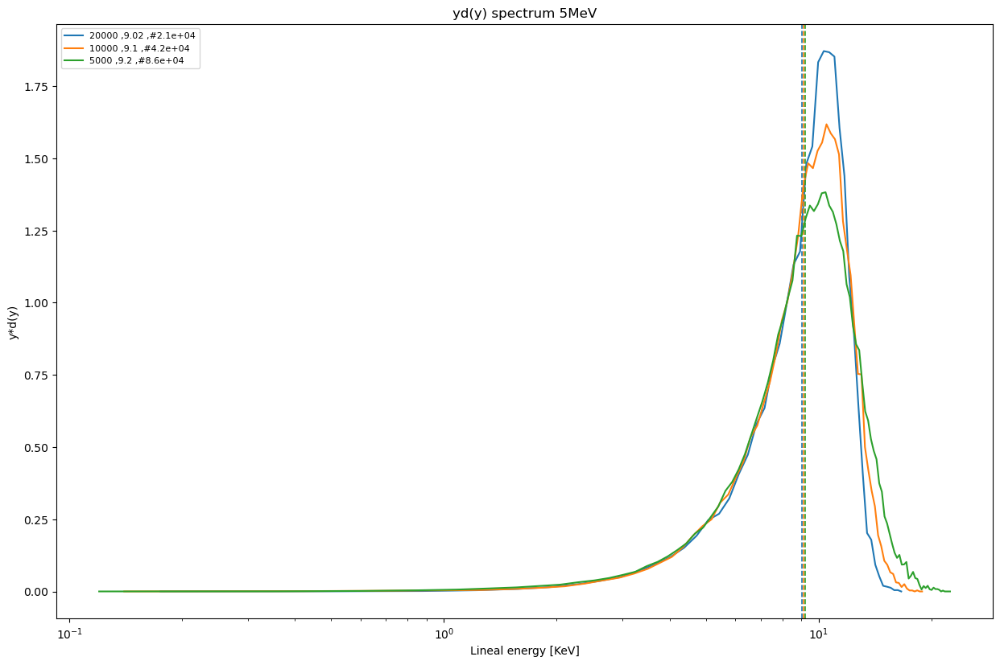

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  5.168903993494255 for  20000 nm
y_d =  5.217679035847039 for  10000 nm
y_d =  5.250924290563958 for  5000 nm


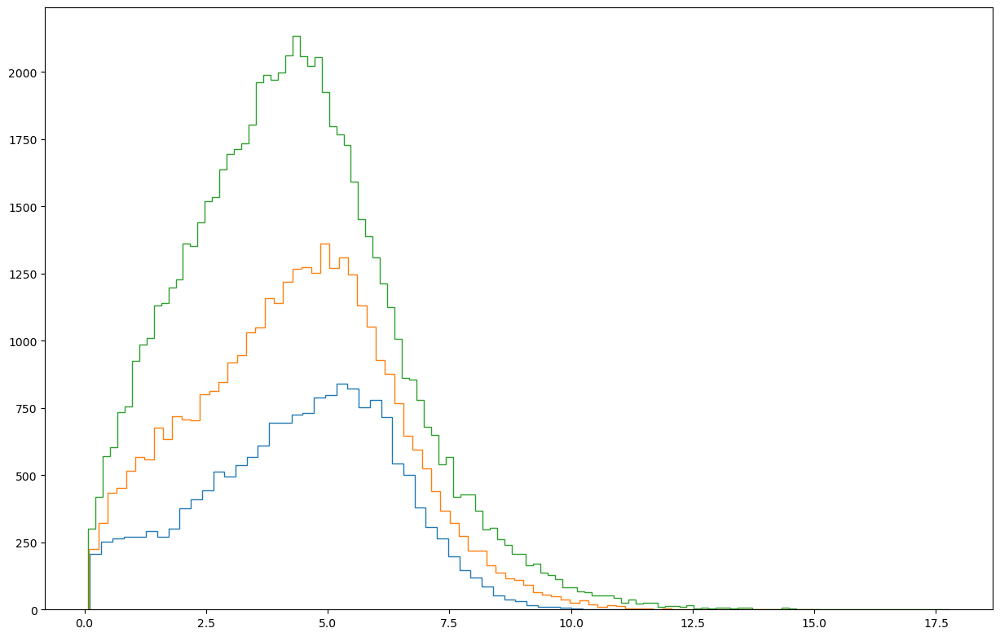

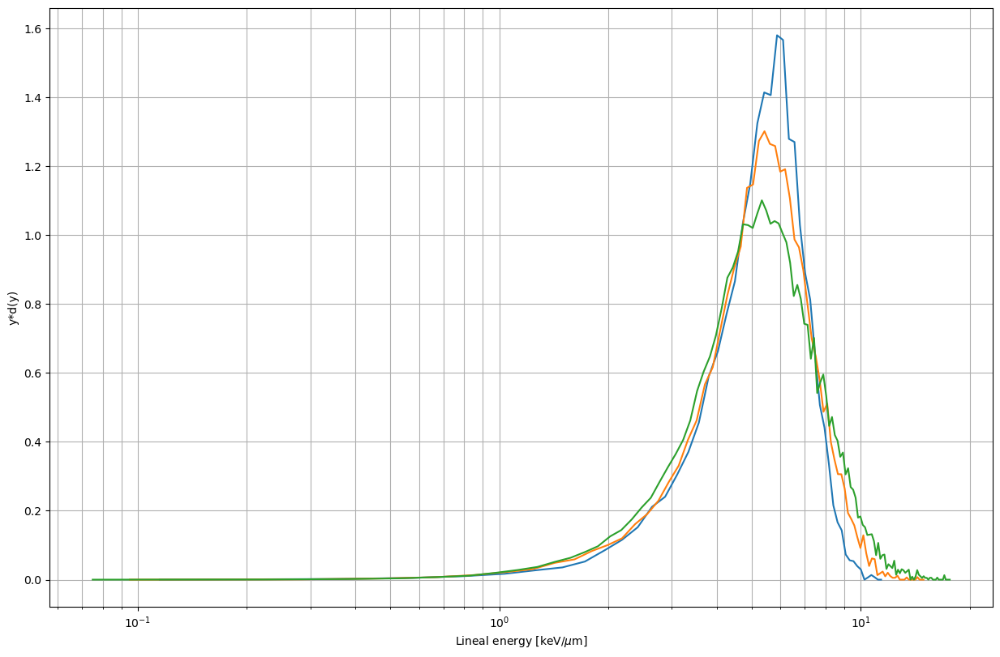

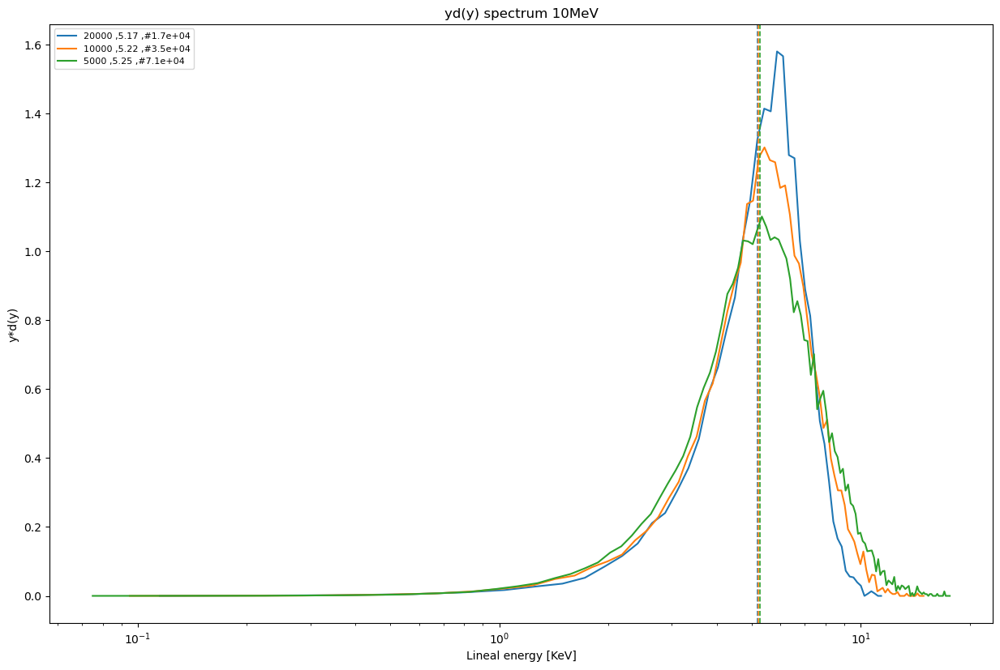

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  2.944585550166309 for  20000 nm
y_d =  2.941603929481851 for  10000 nm
y_d =  2.998729531374247 for  5000 nm


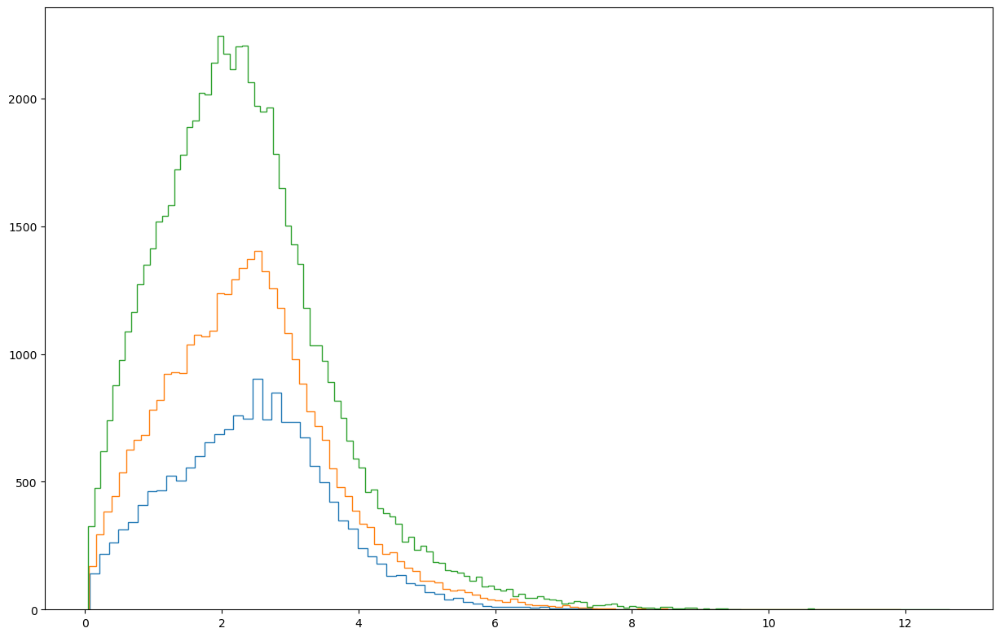

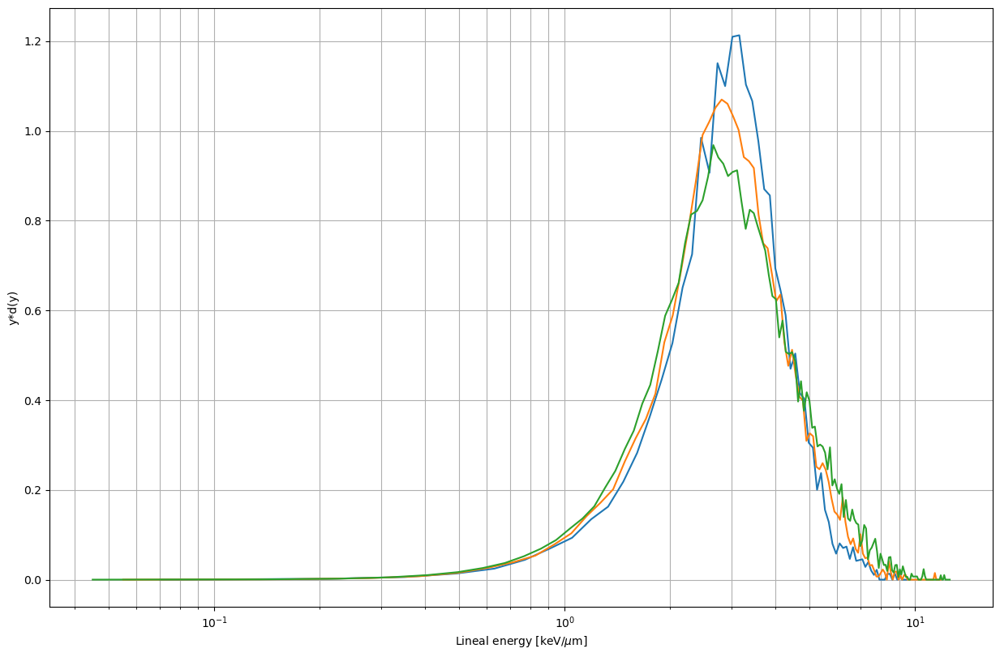

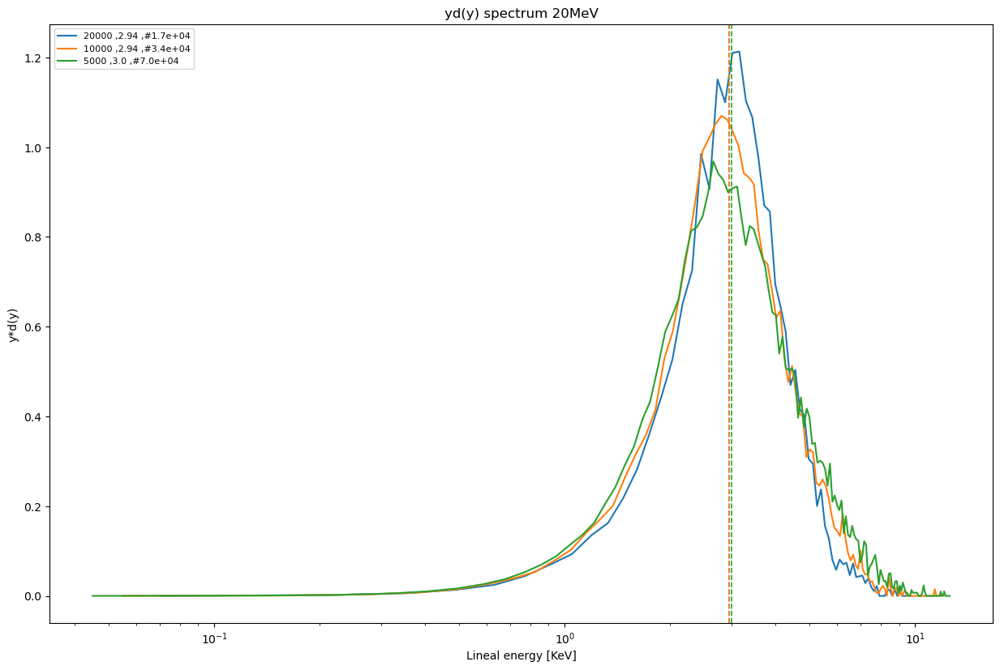

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  1.4278389419722184 for  20000 nm
y_d =  1.4992553833032893 for  10000 nm
y_d =  1.6193137534473854 for  5000 nm


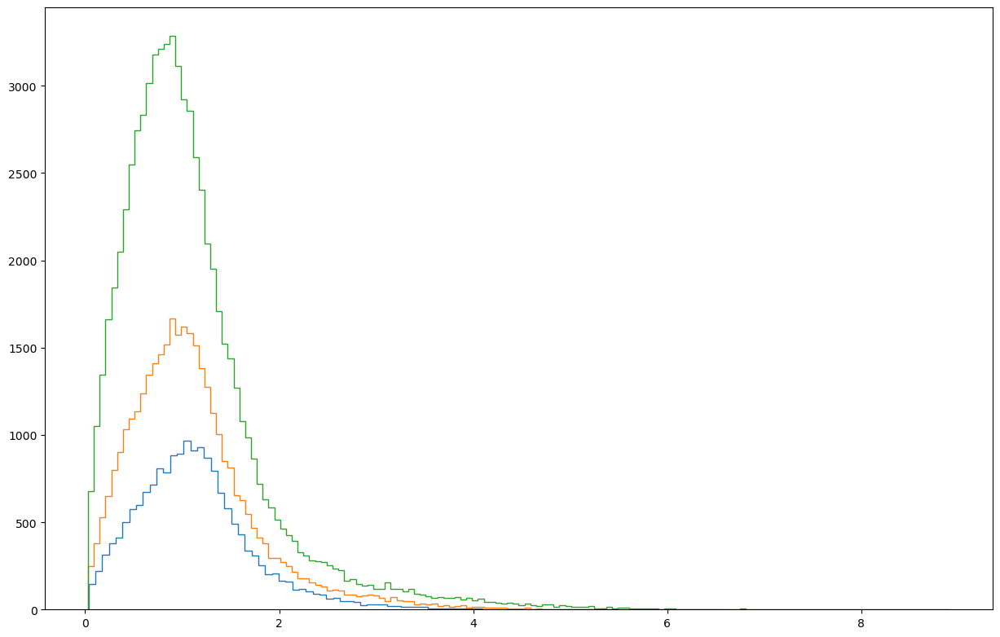

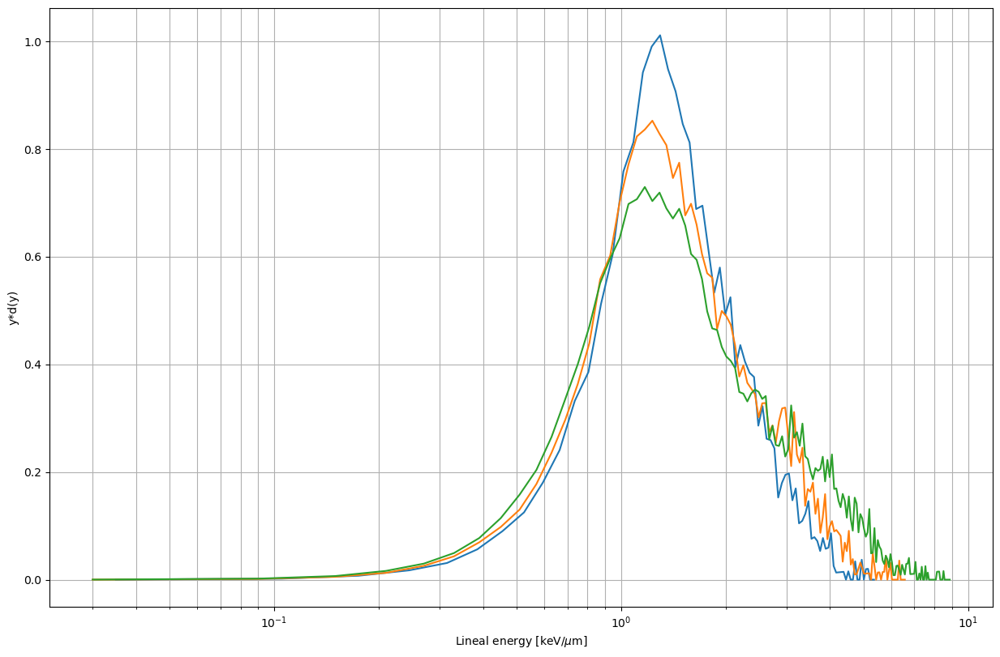

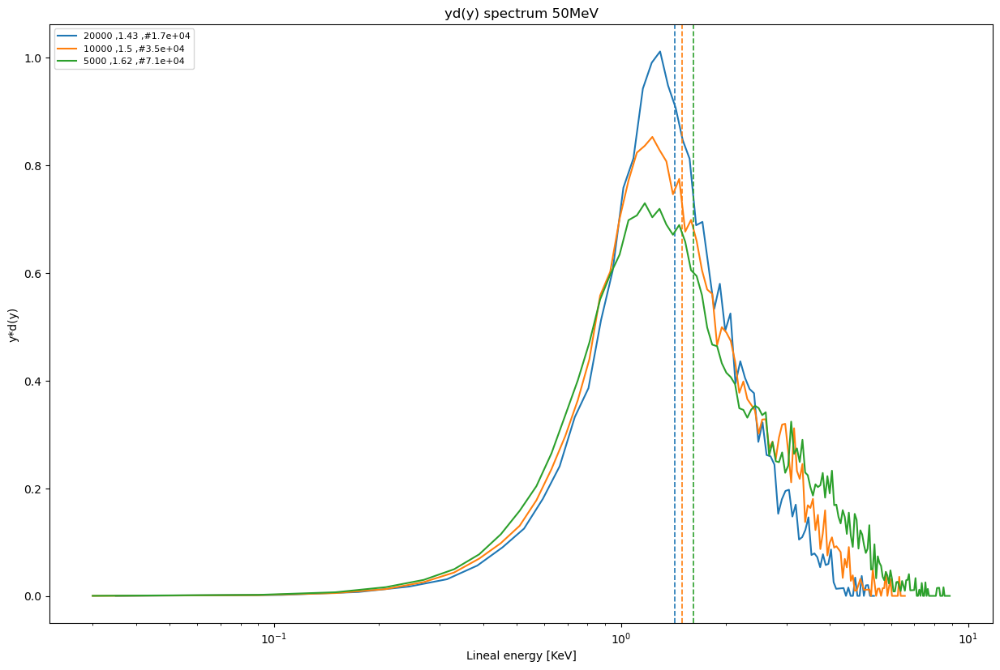

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]
y_d =  0.9119905265725804 for  20000 nm
y_d =  1.0096835735332108 for  10000 nm
y_d =  1.183320457827767 for  5000 nm


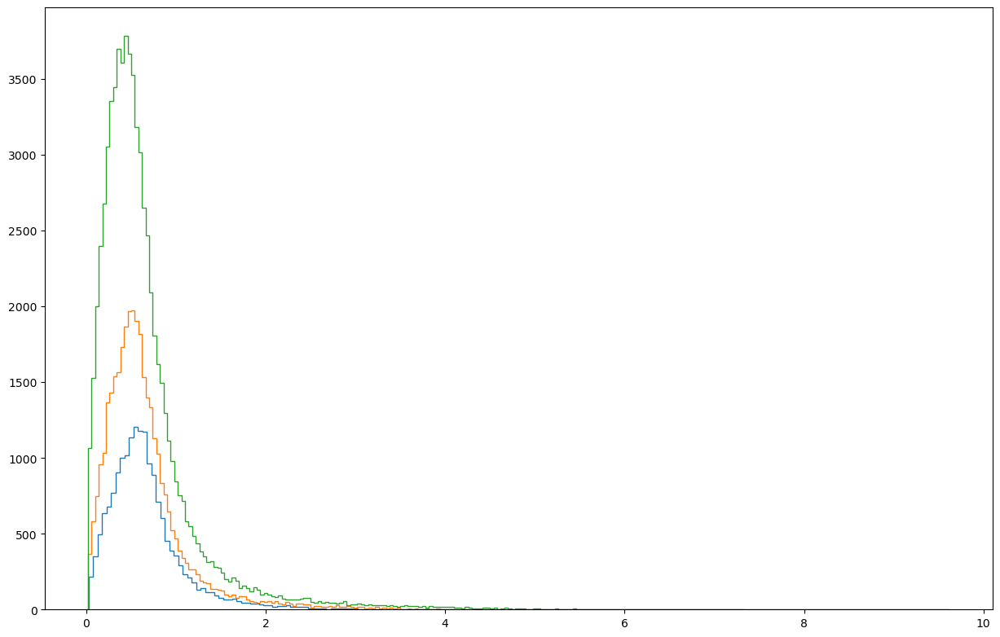

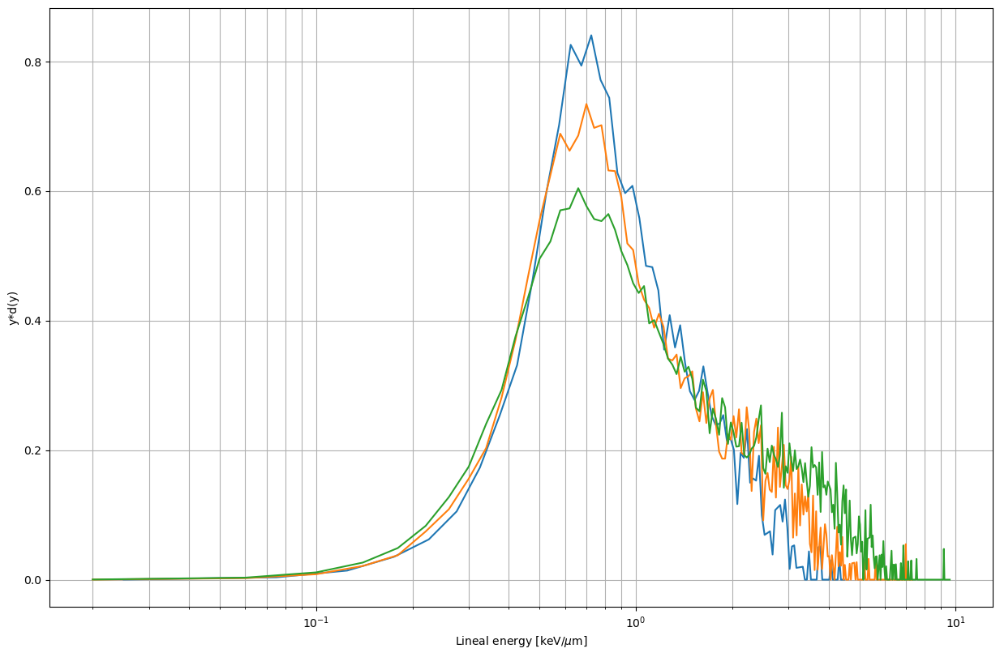

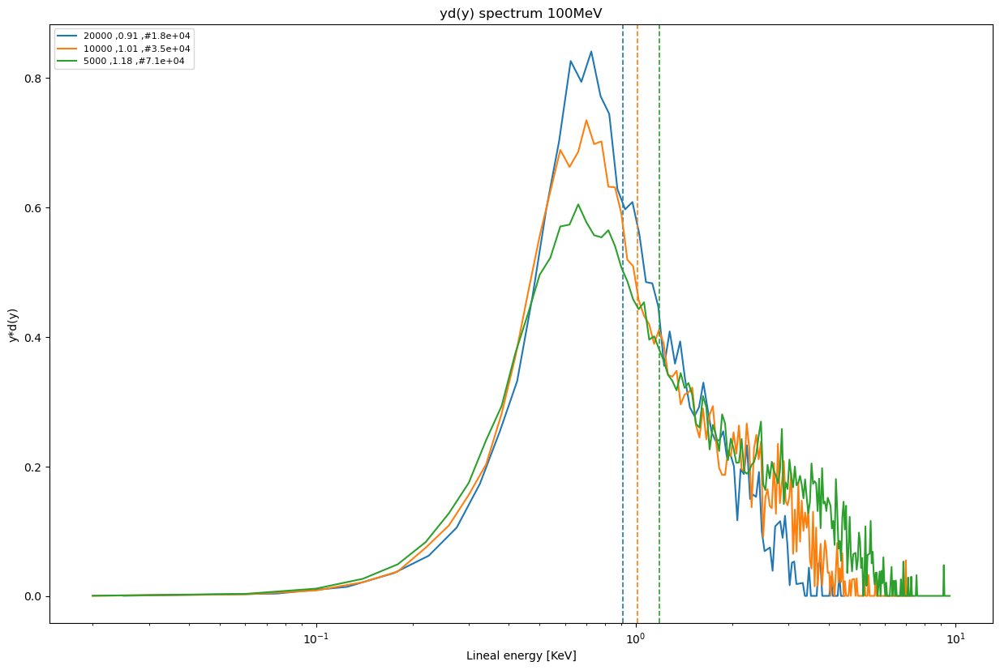

[1.575609123834095, 1.9910894263403622, 2.65333663476203, 4.412070802381241, 7.238094430277909]


,20,10,5
1,39.912251,32.971324,31.114412
2,18.875715,19.101879,19.291219
5,9.015830,9.097307,9.203885
10,5.168904,5.217679,5.250924
20,2.944586,2.941604,2.998730
50,1.427839,1.499255,1.619314
100,0.911991,1.009684,1.183320


In [21]:
yd_df20 = pd.DataFrame(columns=[20, 10, 5])
yf_df20 = pd.DataFrame(columns=[20, 10, 5])
for e in [1, 2, 5, 10, 20, 50, 100]:
    ydy_list20um,yf_list20um = ydyplots20um(e, [20000,10000, 5000]);
    
    print(ydy_list2um)
    yd_df20.loc[e]=ydy_list20um
    yf_df20.loc[e]=yf_list20um
yd_df20

In [22]:
yd_df20.transpose().to_csv('yd_dfs/20um.csv')
yf_df20.transpose().to_csv('yd_dfs/yf_20um.csv')

In [23]:
yd_total = pd.concat([yd_df20.transpose(), yd_df2.transpose().iloc[[0,1]], yd_df.transpose()], axis=0)
yf_total = pd.concat([yf_df20.transpose(), yf_df2.transpose().iloc[[0,1]], yf_df.transpose()], axis=0)

yd_total.to_csv('yd_dfs/yd_total.csv')
yf_total.to_csv('yd_dfs/yf_total.csv')

In [24]:
yd_total.transpose()

,20.00,10.00,5.00,2.00,1.00,0.50,0.20,0.10,0.05,0.02,0.01
1,39.912251,32.971324,31.114412,30.357645,31.093551,29.982400,30.406425,30.543286,30.146708,30.669984,34.107119
2,18.875715,19.101879,19.291219,18.423010,19.040115,18.136233,18.139525,18.211419,19.047197,21.576194,26.115911
5,9.015830,9.097307,9.203885,9.084459,9.087130,8.994052,9.662353,10.707344,12.431820,16.189438,21.265567
10,5.168904,5.217679,5.250924,5.166207,5.423178,5.658273,6.787071,8.162456,10.287969,14.352821,19.532752
20,2.944586,2.941604,2.998730,3.151972,3.535758,3.961214,5.205539,6.827118,8.890316,13.242378,18.572129
50,1.427839,1.499255,1.619314,1.971514,2.391676,2.945373,4.326665,5.988593,8.294630,12.617278,17.806169
100,0.911991,1.009684,1.183320,1.575609,1.991089,2.523597,4.213366,5.695273,7.954300,12.331895,17.725409


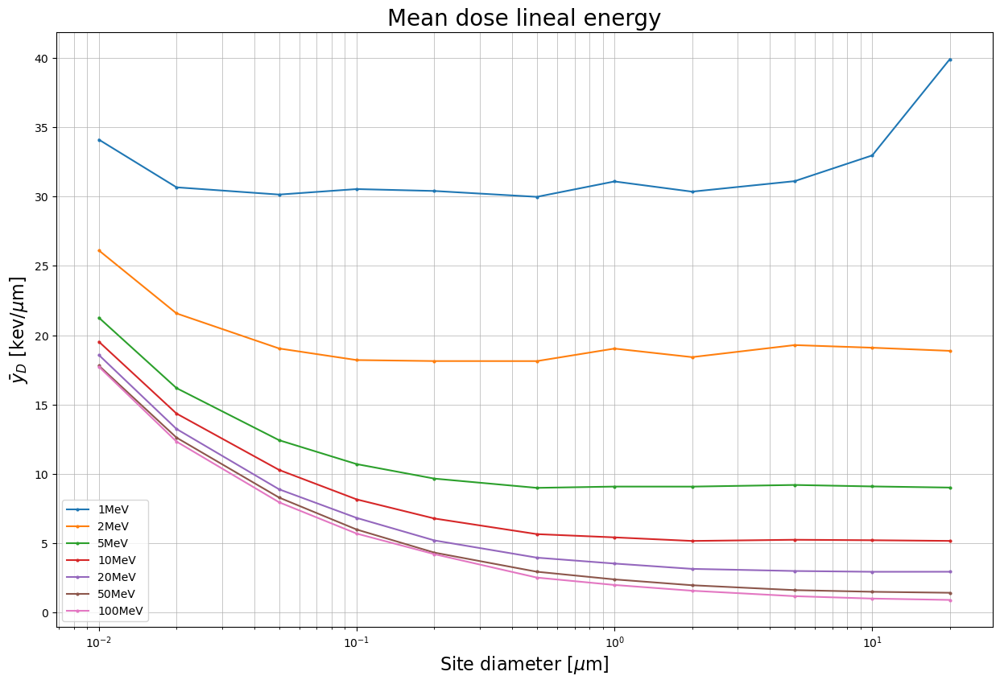

In [25]:
plt.figure(3)
plt.plot(yd_total, '-o', markersize=2)
plt.xscale('log')
plt.legend(['1MeV', '2MeV','5MeV','10MeV','20MeV','50MeV','100MeV'])
#plt.legend([r'20 $\mu$m', r'10 $\mu$m',r'5 $\mu$m',r'2 $\mu$m',r'1 $\mu$m',r'0.5 $\mu$m',r'0.2 $\mu$m', r'0.1 $\mu$m'])

plt.title(r'Mean dose lineal energy', fontsize=20)
plt.xlabel(r'Site diameter [$\mu$m]', fontsize=16)
plt.ylabel(r'$\bar{y}_D$ [kev/$\mu$m]', fontsize=16)
plt.grid(which='both', linewidth=0.5)

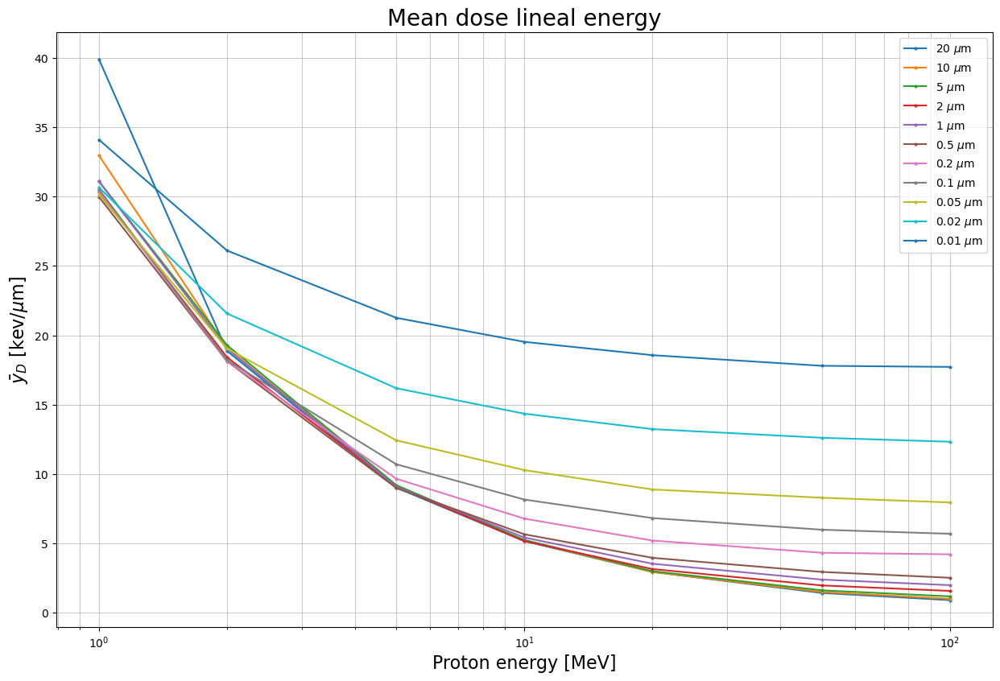

In [26]:
plt.figure(3)
plt.plot(yd_total.transpose(), '-o', markersize=2)
plt.xscale('log')
plt.legend([r'20 $\mu$m', r'10 $\mu$m',r'5 $\mu$m',r'2 $\mu$m',r'1 $\mu$m',r'0.5 $\mu$m',r'0.2 $\mu$m', r'0.1 $\mu$m',r'0.05 $\mu$m',r'0.02 $\mu$m',r'0.01 $\mu$m'])

plt.title(r'Mean dose lineal energy', fontsize=20)
plt.xlabel(r'Proton energy [MeV]', fontsize=16)
plt.ylabel(r'$\bar{y}_D$ [kev/$\mu$m]', fontsize=16)
plt.grid(which='both', linewidth=0.5)

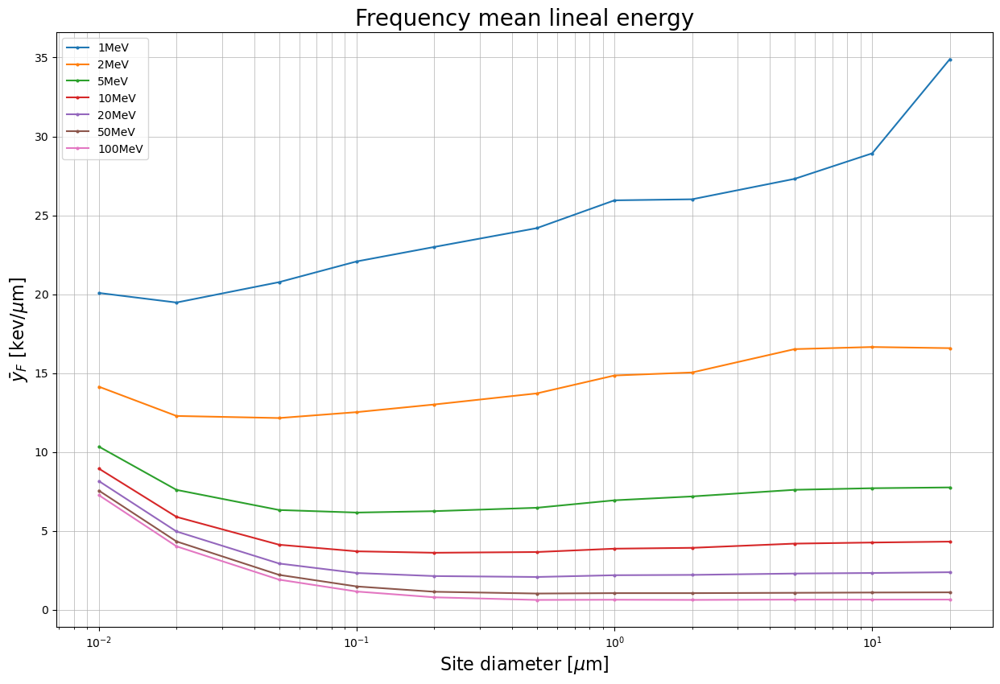

In [27]:
plt.figure(3)
plt.plot(yf_total, '-o', markersize=2)
plt.xscale('log')
plt.legend(['1MeV', '2MeV','5MeV','10MeV','20MeV','50MeV','100MeV'])
plt.title(r'Frequency mean lineal energy', fontsize=20)
plt.xlabel(r'Site diameter [$\mu$m]', fontsize=16)
plt.ylabel(r'$\bar{y}_F$ [kev/$\mu$m]', fontsize=16)
plt.grid(which='both', linewidth=0.5)

In [28]:
ydT = yd_total.transpose()#[[1.0,0.10,0.01]]

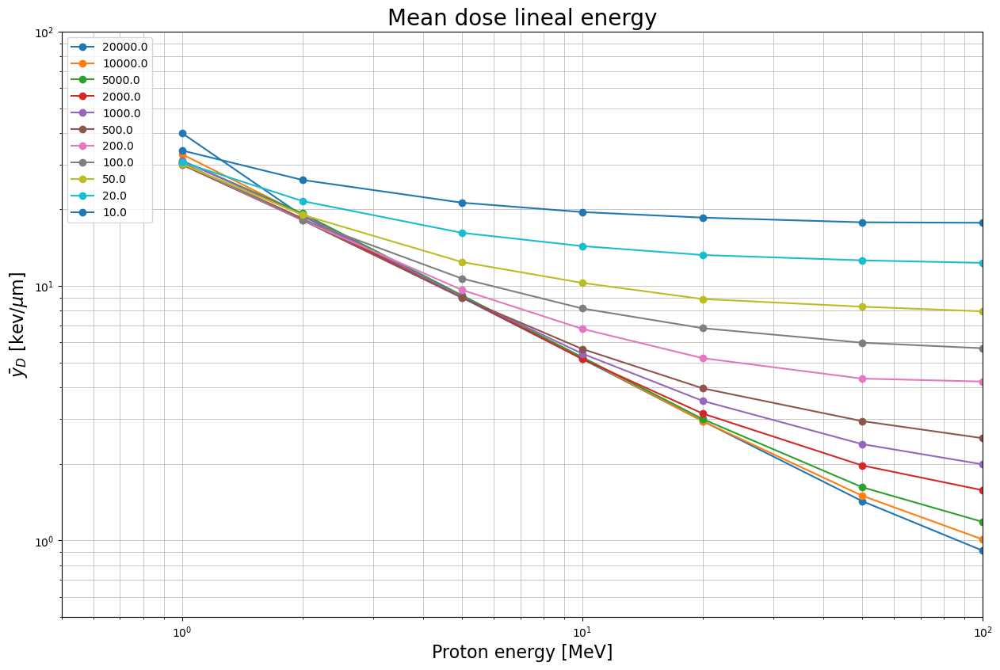

In [29]:
fig = plt.figure(4)
ax = fig.add_subplot(1,1,1)

ax.plot(ydT, '-o', markersize=6)


ax.set_xlim([0.5, 100])
ax.set_ylim([0.5,100])

ax.set_xscale('log')
ax.set_yscale('log')

ax.legend(ydT.columns*1000)

#plt.legend([])
ax.set_title(r'Mean dose lineal energy', fontsize=20)
ax.set_xlabel(r'Proton energy [MeV]', fontsize=16)
ax.set_ylabel(r'$\bar{y}_D$ [kev/$\mu$m]', fontsize=16)
#ax.set_legend([10])
ax.grid(which='both', linewidth=0.5)

plt.show()

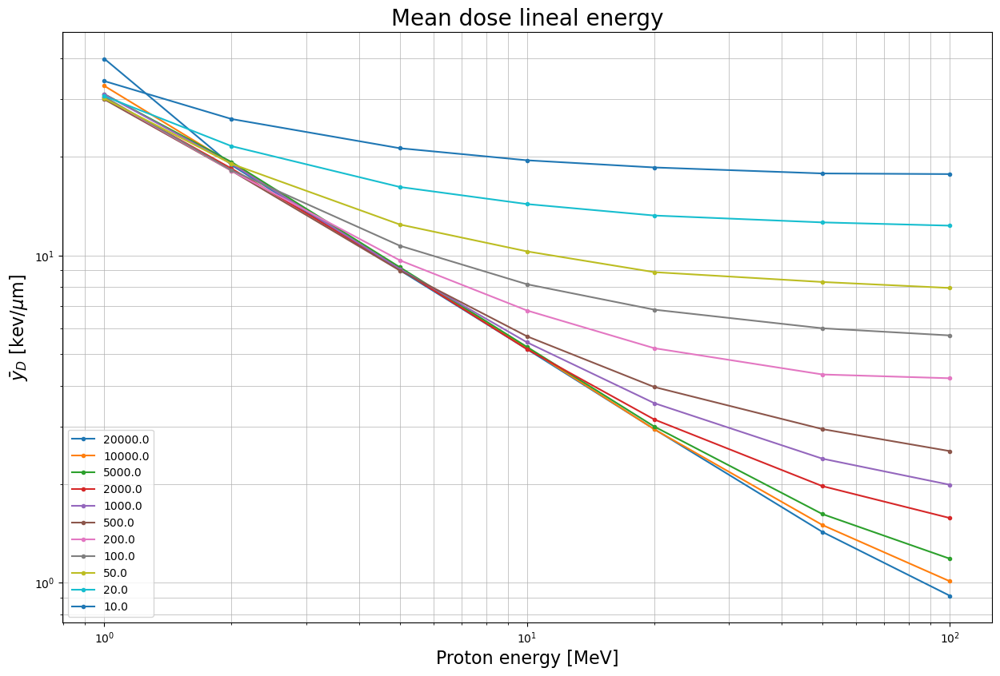

In [30]:
plt.figure(3)
plt.plot(ydT, '-o', markersize=3)
plt.xscale('log')
plt.yscale('log')
plt.legend(ydT.columns*1000)
plt.title(r'Mean dose lineal energy', fontsize=20)
plt.xlabel(r'Proton energy [MeV]', fontsize=16)
plt.ylabel(r'$\bar{y}_D$ [kev/$\mu$m]', fontsize=16)
plt.xlim=[0.1,100]
plt.ylim=[0.1,100]
plt.grid(which='both', linewidth=0.5)

In [31]:
yd_total

,1,2,5,10,20,50,100
20.00,39.912251,18.875715,9.015830,5.168904,2.944586,1.427839,0.911991
10.00,32.971324,19.101879,9.097307,5.217679,2.941604,1.499255,1.009684
5.00,31.114412,19.291219,9.203885,5.250924,2.998730,1.619314,1.183320
2.00,30.357645,18.423010,9.084459,5.166207,3.151972,1.971514,1.575609
1.00,31.093551,19.040115,9.087130,5.423178,3.535758,2.391676,1.991089
0.50,29.982400,18.136233,8.994052,5.658273,3.961214,2.945373,2.523597
0.20,30.406425,18.139525,9.662353,6.787071,5.205539,4.326665,4.213366
0.10,30.543286,18.211419,10.707344,8.162456,6.827118,5.988593,5.695273
0.05,30.146708,19.047197,12.431820,10.287969,8.890316,8.294630,7.954300
0.02,30.669984,21.576194,16.189438,14.352821,13.242378,12.617278,12.331895


# EMLIVERMORE VS G4DNA

In [32]:
g4 = pd.read_csv('yd_dfs/0.5um.csv', index_col=0).iloc[0:3]

livermore = pd.read_csv('yd_dfs/2um.csv', index_col=0).iloc[2:]
print(livermore)
print(g4)


             1          2          5        10        20        50       100
0.5  31.678344  19.994498   9.337879  5.889826  4.186623  3.026656  2.653337
0.2  34.201653  22.505276  10.466668  7.311756  5.816609  4.758410  4.412071
0.1  37.748629  27.254967  12.538212  9.681070  8.334350  7.299468  7.238094
             1          2          5        10        20        50       100
0.5  29.982400  18.136233   8.994052  5.658273  3.961214  2.945373  2.523597
0.2  30.406425  18.139525   9.662353  6.787071  5.205539  4.326665  4.213366
0.1  30.543286  18.211419  10.707344  8.162456  6.827118  5.988593  5.695273


In [33]:
diff = ((g4-livermore)/g4)*100
diff2 = g4-livermore
diff

,1,2,5,10,20,50,100
0.5,-5.656468,-10.246145,-3.822831,-4.092275,-5.690404,-2.759703,-5.141055
0.2,-12.481664,-24.067610,-8.324211,-7.730652,-11.738857,-9.978700,-4.716068
0.1,-23.590598,-49.658670,-17.099180,-18.604856,-22.077143,-21.889531,-27.089504


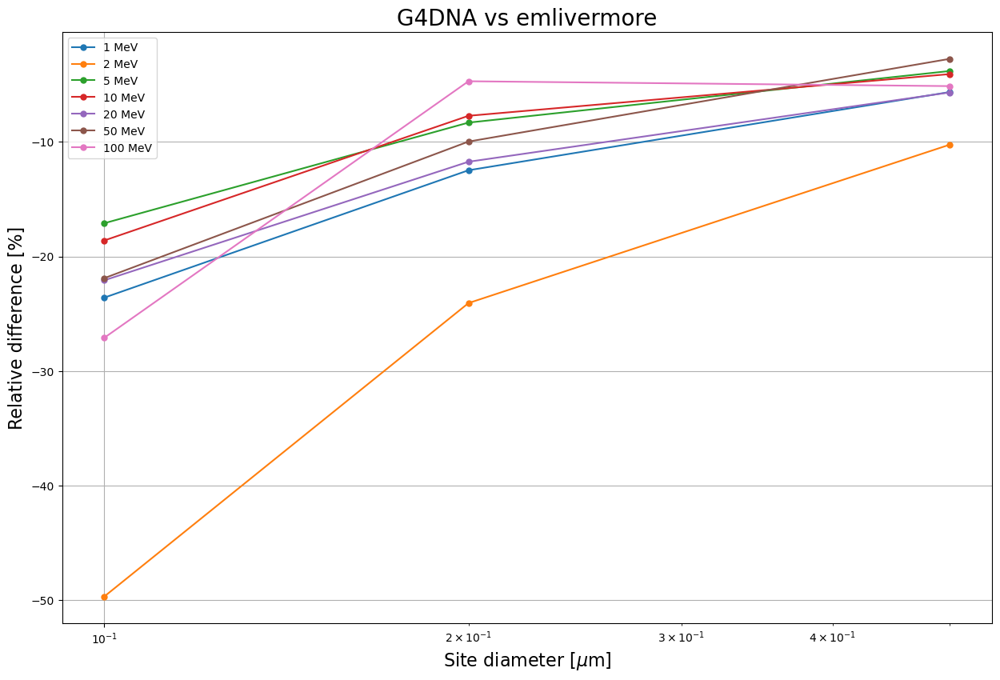

In [34]:
plt.plot(diff, '-o', markersize=5)
plt.legend(diff.columns + ' MeV')
plt.grid()
plt.title('G4DNA vs emlivermore', fontsize=20)
plt.xlabel('Site diameter [$\mu$m]', fontsize=16)
plt.ylabel('Relative difference [%]', fontsize=16)
plt.xscale('log')

In [35]:
liam = pd.read_csv('liamsuwan_2014_yd.csv', delimiter=';', header=0,index_col=0)
liam.columns=['10', '100']
liam

,10,100
0.3,68.9,76.4
0.5,49.0,56.5
1.0,33.4,34.6
2.0,25.9,21.2
5.0,20.2,12.3
10.0,17.8,9.0
50.0,14.8,5.8
100.0,15.1,6.3
200.0,16.4,5.7
300.0,15.3,6.4


In [36]:
yd_total=pd.read_csv('yd_dfs/yd_total.csv',header=0, index_col=0)
yd_compare = yd_total.transpose()[[1.0, 0.10,0.01]]
yd_compare.columns = ['1000','100', '10']
yd_compare.index=[1, 2, 5, 10, 20, 50, 100]

In [37]:
nijko=pd.read_csv('nijko2016.csv',delimiter=';',header=0, index_col=0)
nijko.columns=['1000']
vas = pd.read_csv('vassiliev2019.csv',delimiter=';',header=0, index_col=0)
vas.columns=['10','100','1000']

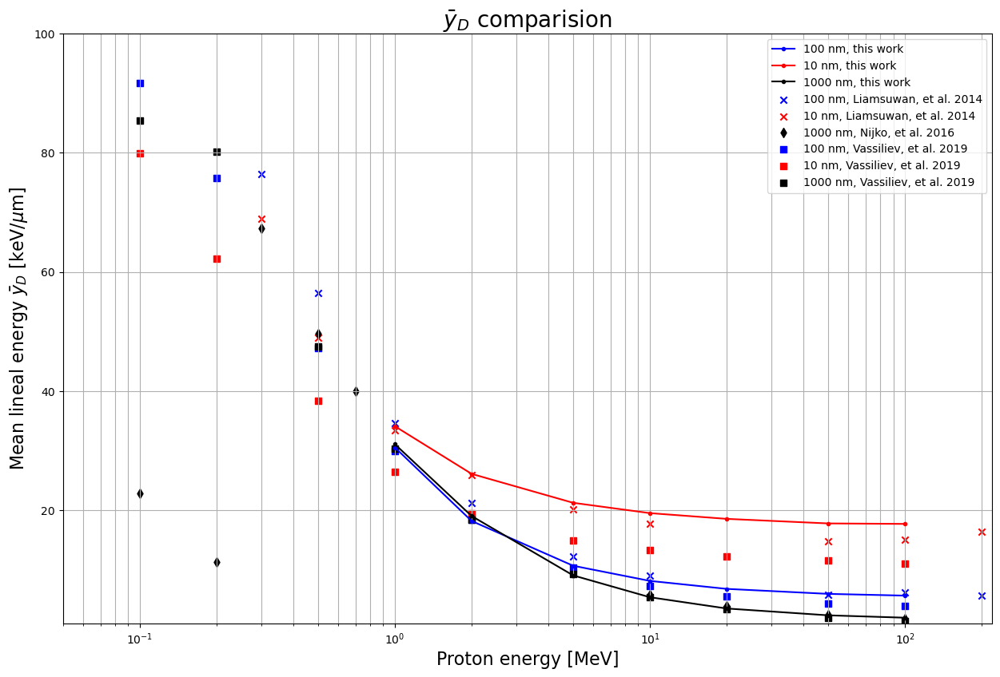

In [38]:
plt.figure(5)
plt.plot(yd_compare.index, yd_compare['100'], marker='o',markersize=3 ,label = '100 nm, this work', color='blue')
plt.plot(yd_compare.index, yd_compare['10'], marker='o',markersize=3, label = '10 nm, this work', color='red')
plt.plot(yd_compare.index, yd_compare['1000'], marker='o',markersize=3, label = '1000 nm, this work', color='black')
plt.scatter(liam.index, liam['100'], marker='x', label = '100 nm, Liamsuwan, et al. 2014', color='blue')
plt.scatter(liam.index, liam['10'], marker='x', label = '10 nm, Liamsuwan, et al. 2014', color='red')
plt.scatter(nijko.index, nijko['1000'], marker='d', label = '1000 nm, Nijko, et al. 2016', color='black')
plt.scatter(vas.index,vas['100'],marker='s' ,label = '100 nm, Vassiliev, et al. 2019', color='blue')
plt.scatter(vas.index,vas['10'],marker='s' ,label = '10 nm, Vassiliev, et al. 2019', color='red')
plt.scatter(vas.index,vas['1000'],marker='s' ,label = '1000 nm, Vassiliev, et al. 2019', color='black')


plt.xscale('log')
#plt.yscale('log')

plt.grid(which='both')
plt.axis([0.05,220, 1,100])

plt.title(r'$\bar{y}_D$ comparision', fontsize=20)
plt.xlabel('Proton energy [MeV]',fontsize=16)
plt.ylabel(r'Mean lineal energy $\bar{y}_D$ [keV/$\mu$m]',fontsize=16)
plt.legend()
plt.show()

In [51]:
#not in use
#plt.plot(yd_compare, marker='.', label=yd_compare.columns +' nm, this work', color='red')
#plt.plot(liam, marker='.', label=liam.columns +' nm, Liamsuwan 2014', color='blue')
#plt.xscale('log')
#plt.yscale('log')


In [40]:
yd = pd.read_csv('yd_dfs/yd_total.csv', index_col=0)
ydt = yd.transpose()
ydt = ydt[[20, 10, 1, 0.5, 0.1,0.05, 0.01]]
LET = [26.08,15.86,7.91,4.57,2.61,1.25,0.73]
ydt.index = [1,2,5,10,20,50,100]
yd

,1,2,5,10,20,50,100
20.00,39.912251,18.875715,9.015830,5.168904,2.944586,1.427839,0.911991
10.00,32.971324,19.101879,9.097307,5.217679,2.941604,1.499255,1.009684
5.00,31.114412,19.291219,9.203885,5.250924,2.998730,1.619314,1.183320
2.00,30.357645,18.423010,9.084459,5.166207,3.151972,1.971514,1.575609
1.00,31.093551,19.040115,9.087130,5.423178,3.535758,2.391676,1.991089
0.50,29.982400,18.136233,8.994052,5.658273,3.961214,2.945373,2.523597
0.20,30.406425,18.139525,9.662353,6.787071,5.205539,4.326665,4.213366
0.10,30.543286,18.211419,10.707344,8.162456,6.827118,5.988593,5.695273
0.05,30.146708,19.047197,12.431820,10.287969,8.890316,8.294630,7.954300
0.02,30.669984,21.576194,16.189438,14.352821,13.242378,12.617278,12.331895


Text(0.5, 1.0, 'Mean dose lineal energy')

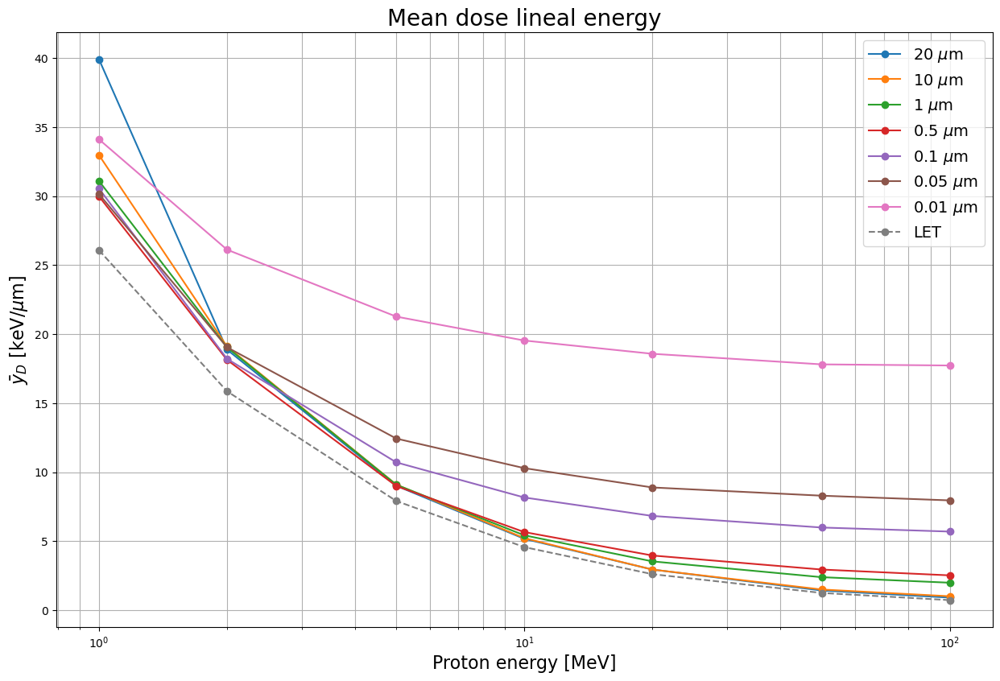

In [41]:
plt.figure()
plt.plot(ydt, 'o-')

plt.xscale('log')
plt.plot(ydt.index, LET,'o--')
plt.legend(['20 $\mu$m', '10 $\mu$m', '1 $\mu$m', '0.5 $\mu$m', '0.1 $\mu$m', '0.05 $\mu$m' ,'0.01 $\mu$m', 'LET'], fontsize=14)
plt.grid(which='both')
plt.ylabel(r'$\bar{y}_D$ [keV/$\mu$m]', fontsize=16)
plt.xlabel('Proton energy [MeV]', fontsize=16)
plt.title('Mean dose lineal energy', fontsize=20)

In [42]:
yf = pd.read_csv('yd_dfs/yf_total.csv', index_col=0)
yf.columns=yf.columns.astype(float)
yft = yf.transpose()[[20,10,2,1,0.5,0.1,0.05,0.02, 0.01]]

Text(0.5, 1.0, 'Frequency mean lineal energy')

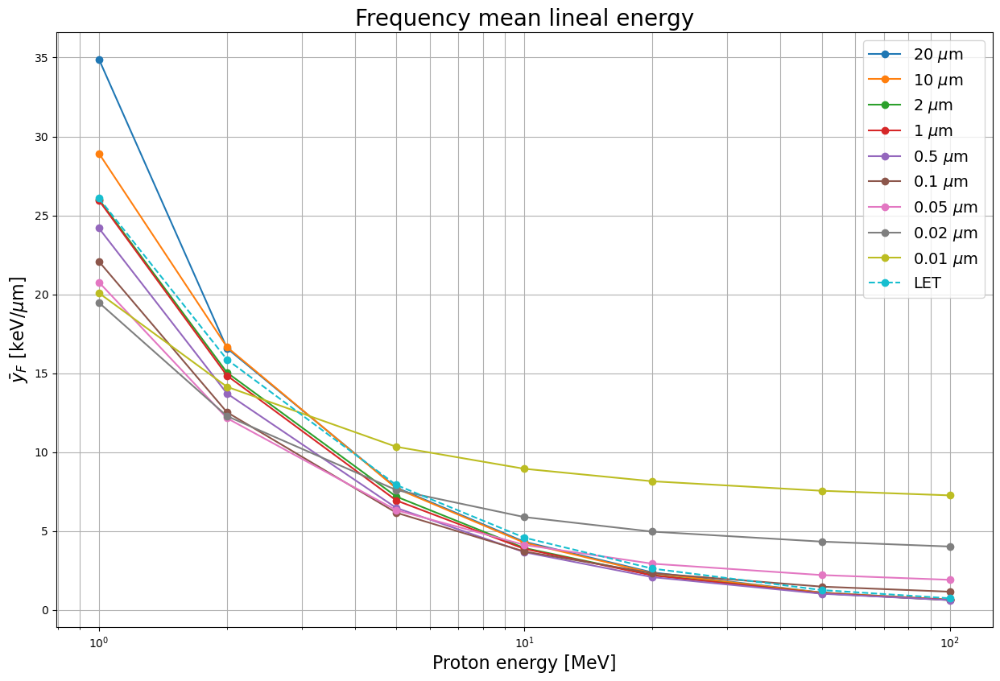

In [43]:
#Frequency mean lineal energy plotting
plt.figure()
plt.plot(yft, 'o-')#,label = yft.columns)

plt.xscale('log')

plt.plot(ydt.index, LET,'o--')
plt.legend(['20 $\mu$m', '10 $\mu$m','2 $\mu$m', '1 $\mu$m', '0.5 $\mu$m', '0.1 $\mu$m', '0.05 $\mu$m' ,'0.02 $\mu$m','0.01 $\mu$m', 'LET'], fontsize=14)
plt.grid(which='both')
plt.ylabel(r'$\bar{y}_F$ [keV/$\mu$m]', fontsize=16)
plt.xlabel('Proton energy [MeV]', fontsize=16)
plt.title('Frequency mean lineal energy', fontsize=20)